In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FormatStrFormatter
import re

In [2]:
#load_cycleTime solo vplc
def load_cycleTime2(curDir, file):
    # Lista per memorizzare i valori estratti
    values = []
    # percorso assoluto file 
    file_path=curDir + '/' + file
    # Leggo file
    with open(file_path, 'r') as file:
        for line in file:
            # Trova il simbolo '#' nella riga
            if '#' in line:
                # Estrae la parte della riga dopo il simbolo '#'
                after_hash = line.split('#')[1].strip()
                # Trova il primo intero dopo il simbolo '#'
                match = re.search(r'\d+', after_hash)
                if match:
                    values.append(int(match.group(0)))
    
    return values

In [3]:
#load_jitter solo vplc
def load_jitter2(curDir, file):
    # Lista per memorizzare i valori estratti
    values = []
    # percorso assoluto file 
    file_path = curDir + '/' + file
    # Leggo file
    with open(file_path, 'r') as file:
        for line in file:
            # Trova il simbolo '#' nella riga
            if '#' in line:
                # Estrae la parte della riga dopo il simbolo '#'
                after_hash = line.split('#')[1].strip()
                # Trova tutti i numeri dopo il simbolo '#'
                numbers_after_hash = re.findall(r'-?\d+', after_hash)
                # Se ci sono almeno due numeri dopo il simbolo '#', aggiungi il secondo alla lista
                if len(numbers_after_hash) >= 2:
                    jitter = int(numbers_after_hash[1])
                    values.append(jitter)
    
    return values

funziona
tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
720584
tasktimes_0.log
tasktimes_1.log
tasktimes_2.log
tasktimes_3.log
tasktimes_4_not_part_of_it.log
836966
1557550


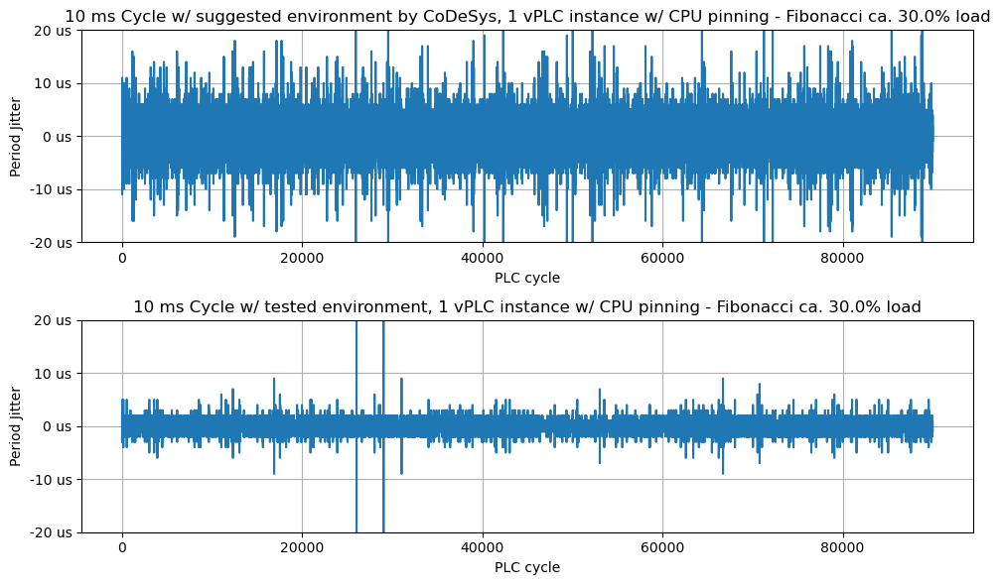

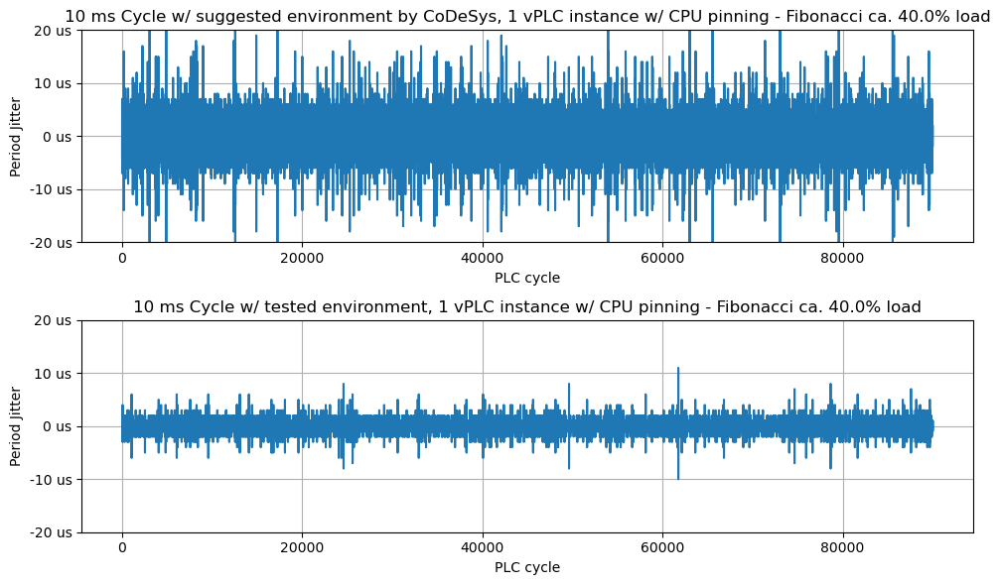

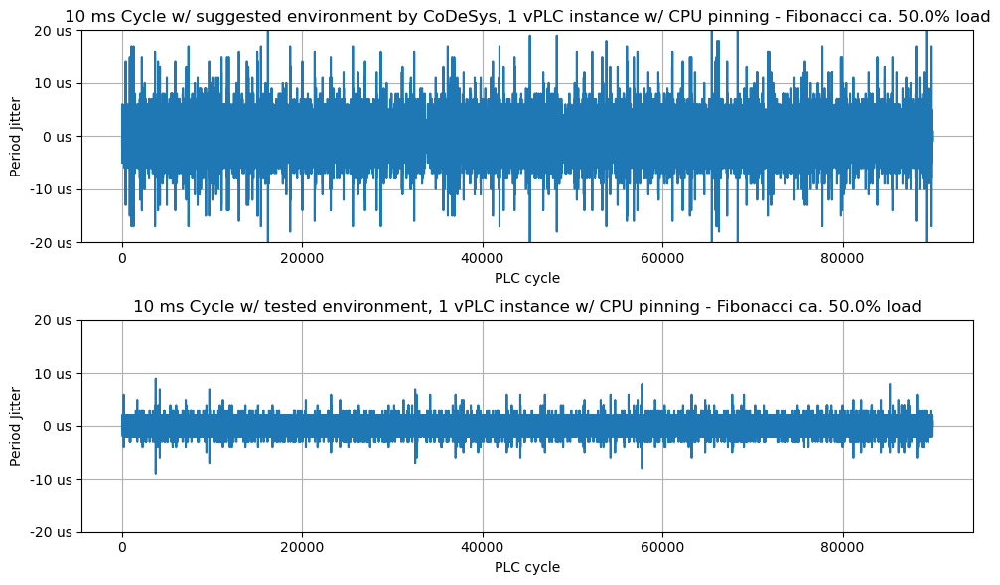

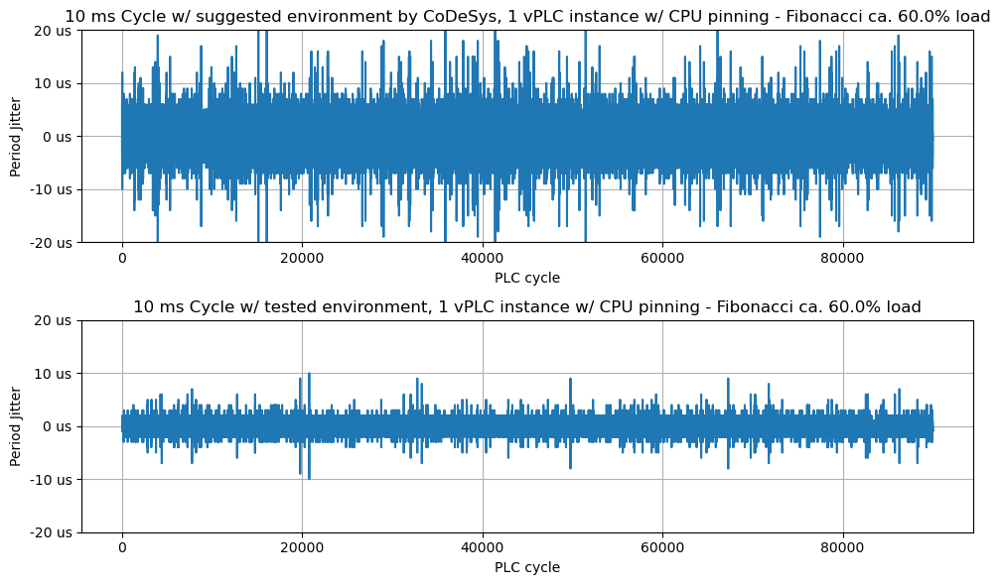

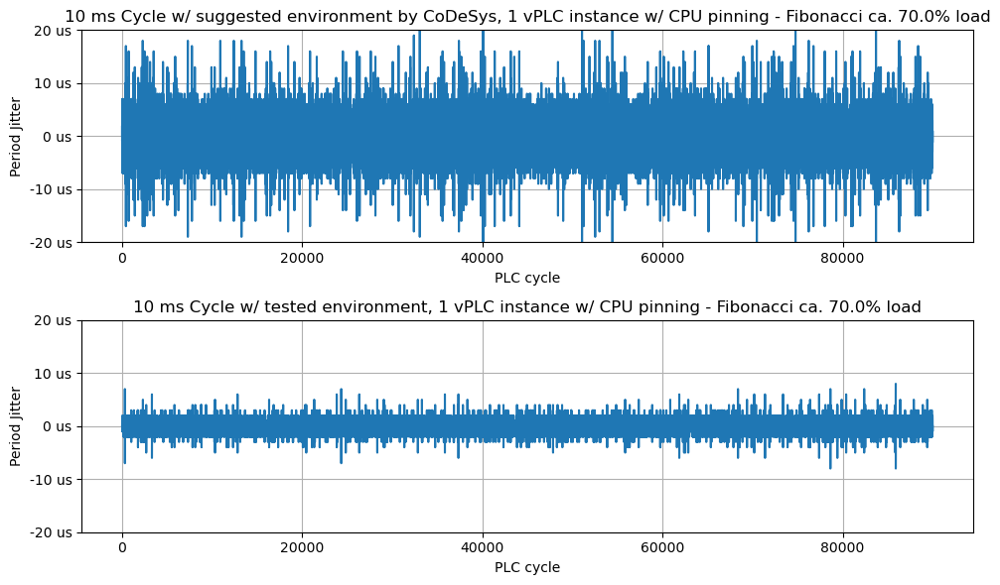

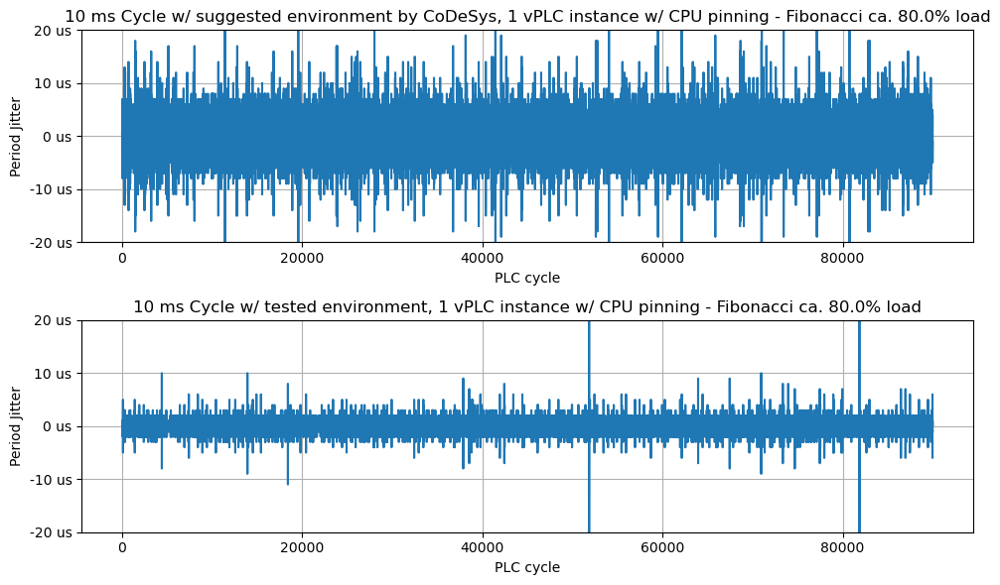

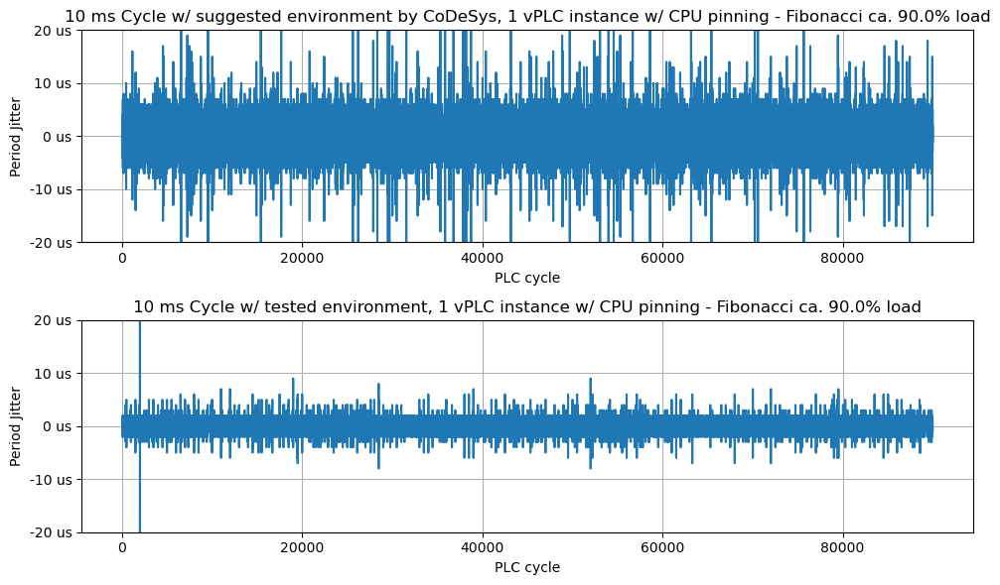

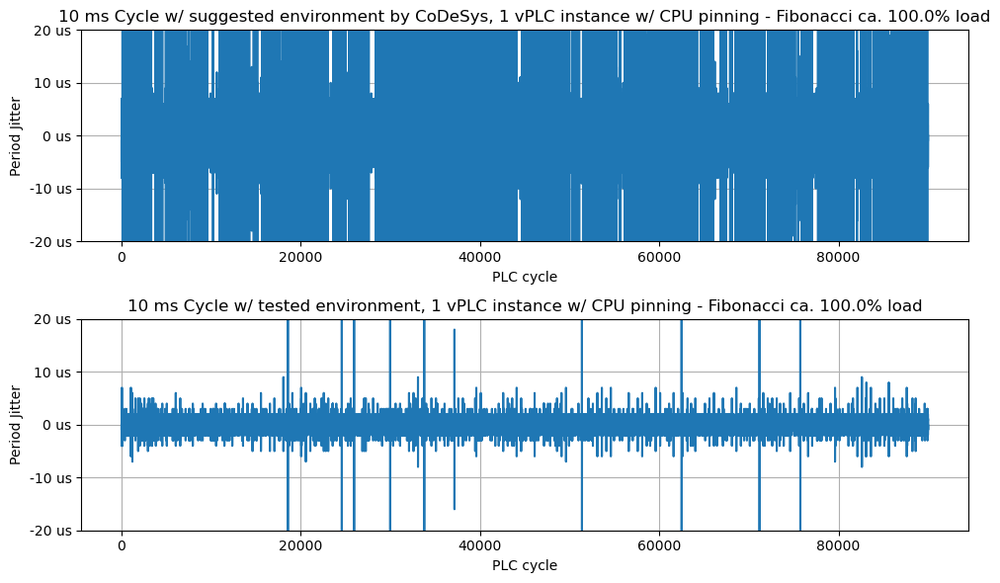

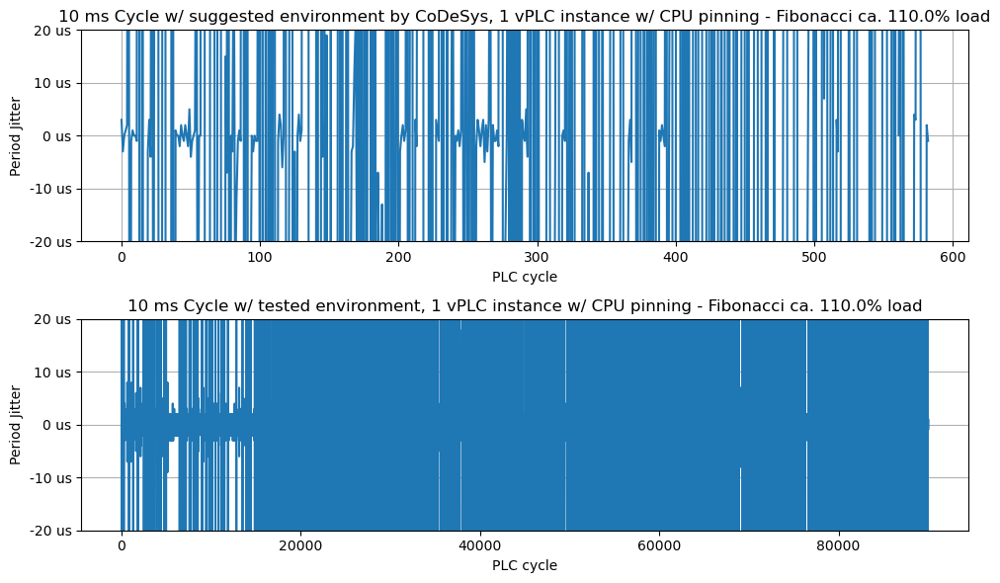

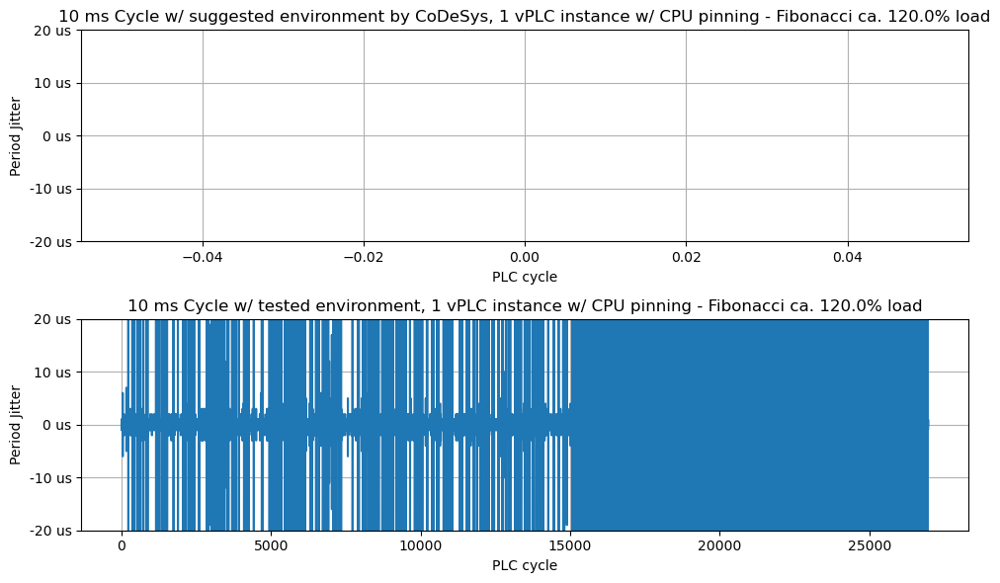

In [4]:
#un’istanza vplc con pinning ad una cpu
#configurazioni a confronto: la 11 con quella di codesys
#metto qui i due percorsi
print('funziona')
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-increase-4cpu-pin")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-increase-3cpu-pin")
val=90000 
k=300
jitterCodesys=[]
jitterNewConf=[]
jitterTot=[]
#prendo tutti i log della configurazione codesys
for f in sorted(os.listdir(conf_codesys)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultCodesys = load_jitter2(conf_codesys, f)
        jitterCodesys+=resultCodesys
        print(f)
        
if os.path.exists(conf_codesys + "/" + "tasktimes.log"):
    resultCodesys = load_jitter2(conf_codesys, f)
    jitterCodesys+=resultCodesys
    print("tasktimes.log")
    
print(len(jitterCodesys))

#prendo tutti i log della configurazione 11
for f in sorted(os.listdir(conf_new)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultNewConf = load_jitter2(conf_new, f)
        jitterNewConf+=resultNewConf
        print(f)
        
if os.path.exists(conf_new + "/" + "tasktimes.log"):
    resultNewConf = load_jitter2(conf_new, f)
    jitterNewConf+=resultNewConf
    print("tasktimes.log")

print(len(jitterNewConf))

#prendo la y massima

jitterTot=jitterCodesys+jitterNewConf
print(len(jitterTot))
maxTot=max(jitterTot)


#stampo le due configurazioni nello stesso grafico 
for i in range(1, max(len(jitterNewConf), len(jitterCodesys)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=jitterCodesys[i:i+val]
    resultNewConf=jitterNewConf[i:i+val]
  
    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('10 ms Cycle w/ suggested environment by CoDeSys, 1 vPLC instance w/ CPU pinning - Fibonacci ca. ' + str(k/10.0) + '% load')

    plt.xlabel('PLC cycle')
    plt.ylabel('Period Jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(-20,20)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('10 ms Cycle w/ tested environment, 1 vPLC instance w/ CPU pinning - Fibonacci ca. ' + str(k/10.0) + '% load')
    
    plt.xlabel('PLC cycle')
    plt.ylabel('Period Jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(-20,20)
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('fiboinc1cpu-' + str(k) + '.png')
    plt.show()
    k=k+100


tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
720074
tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
719926
1440000


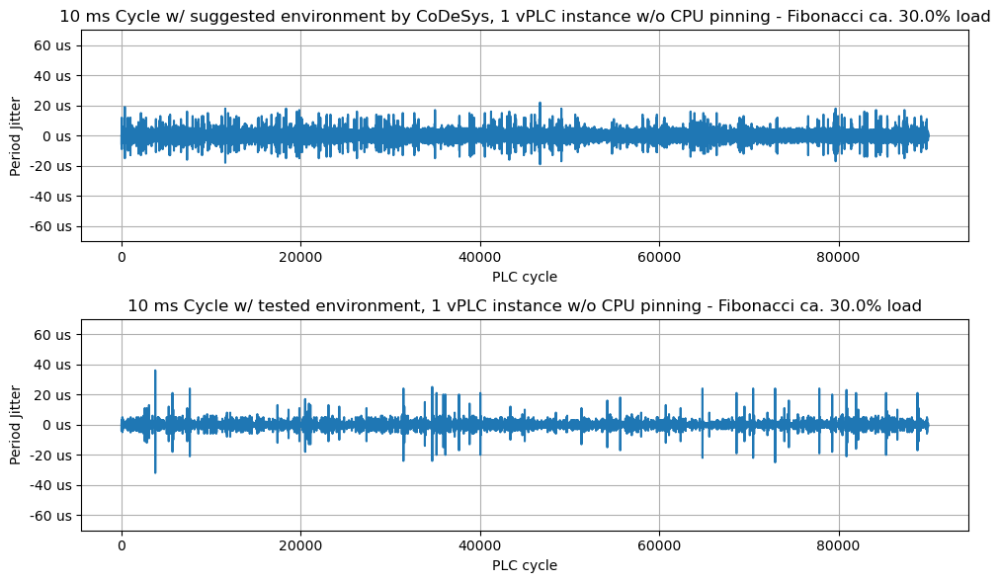

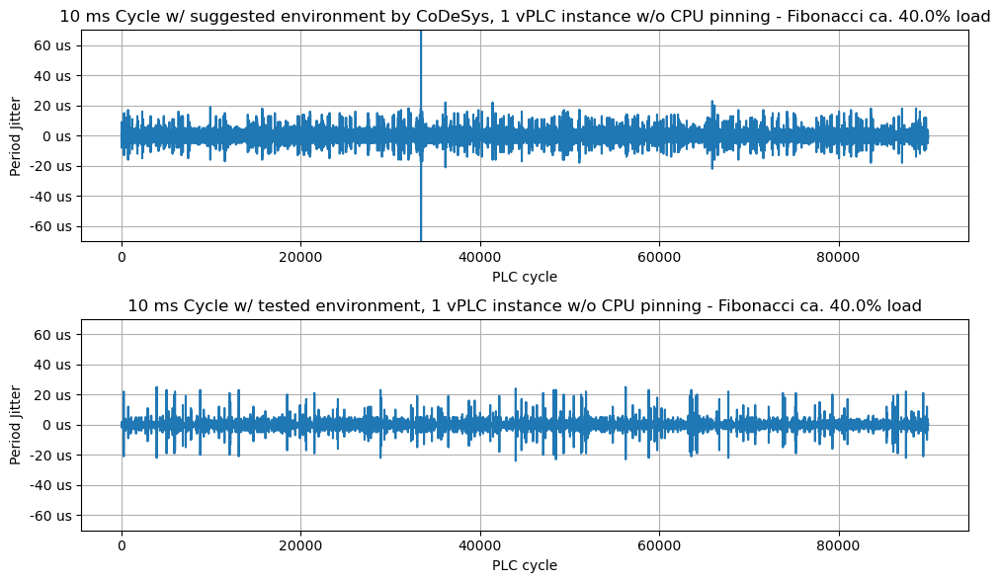

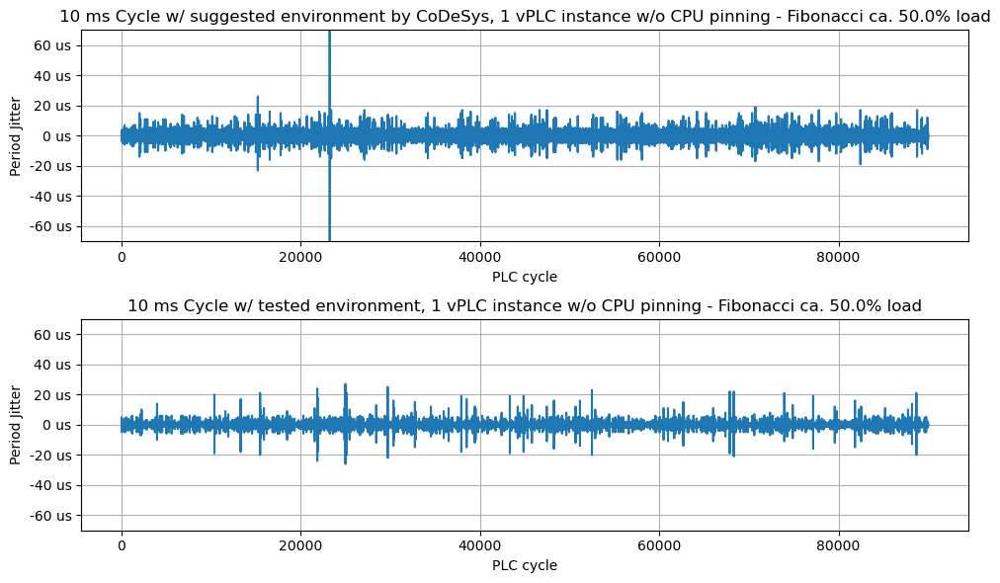

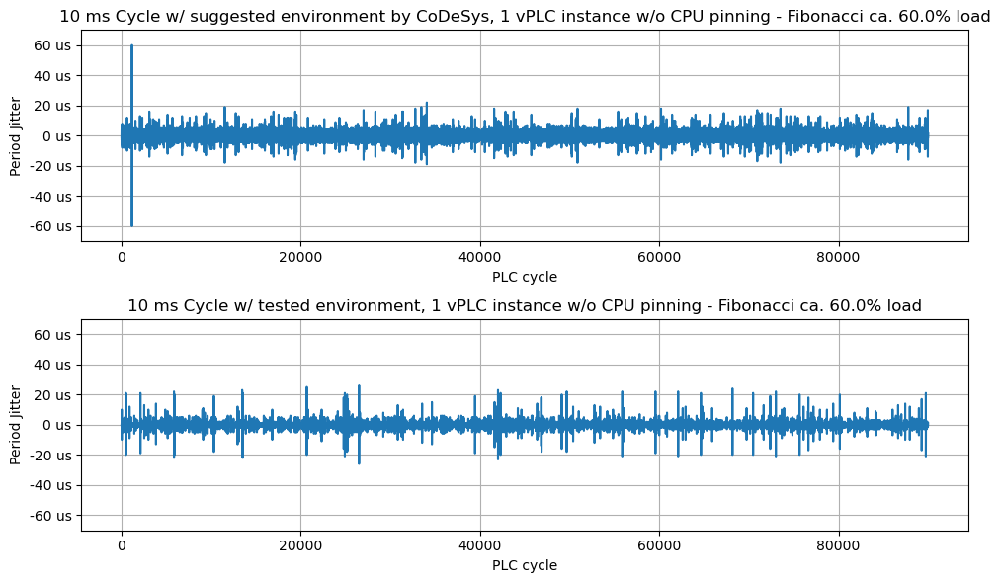

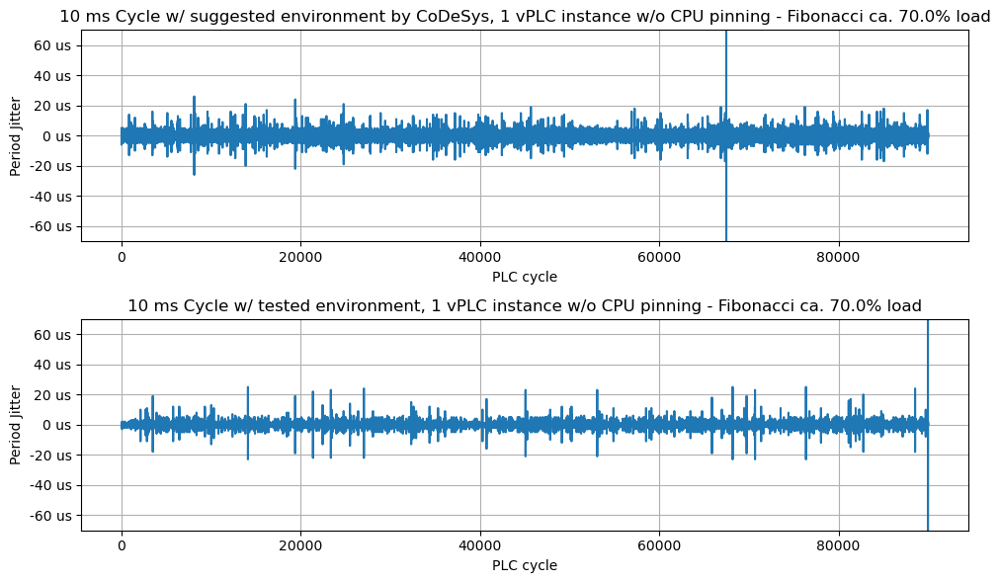

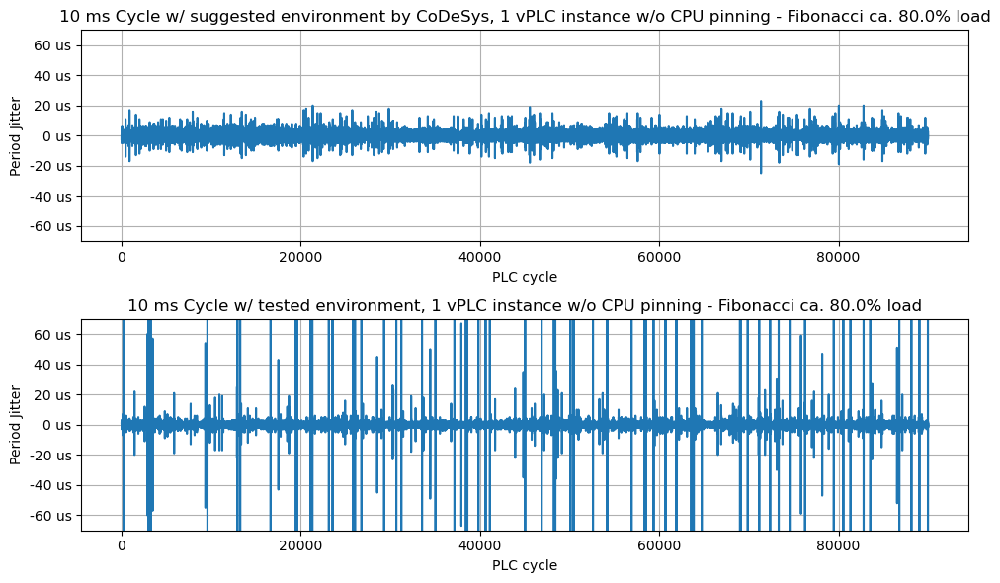

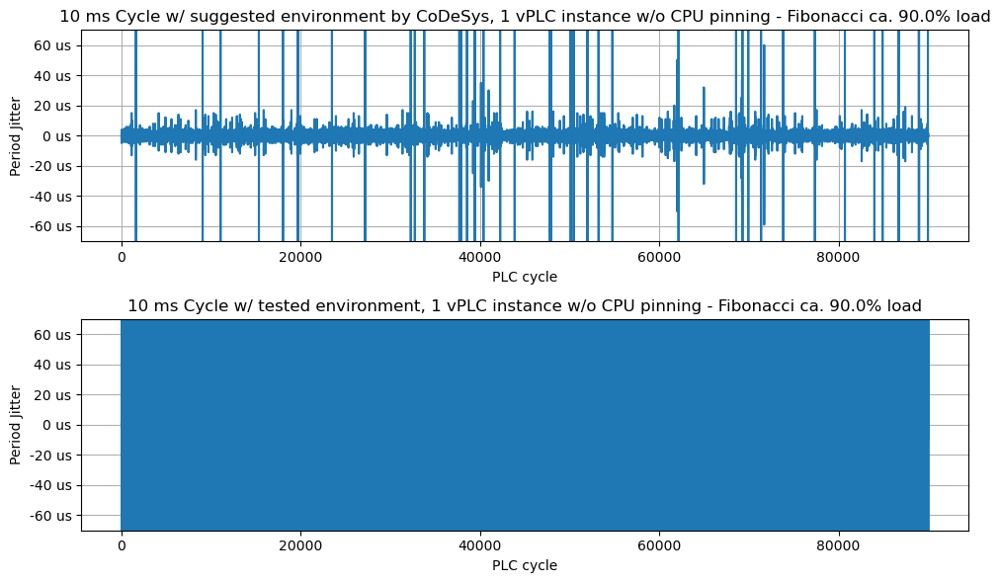

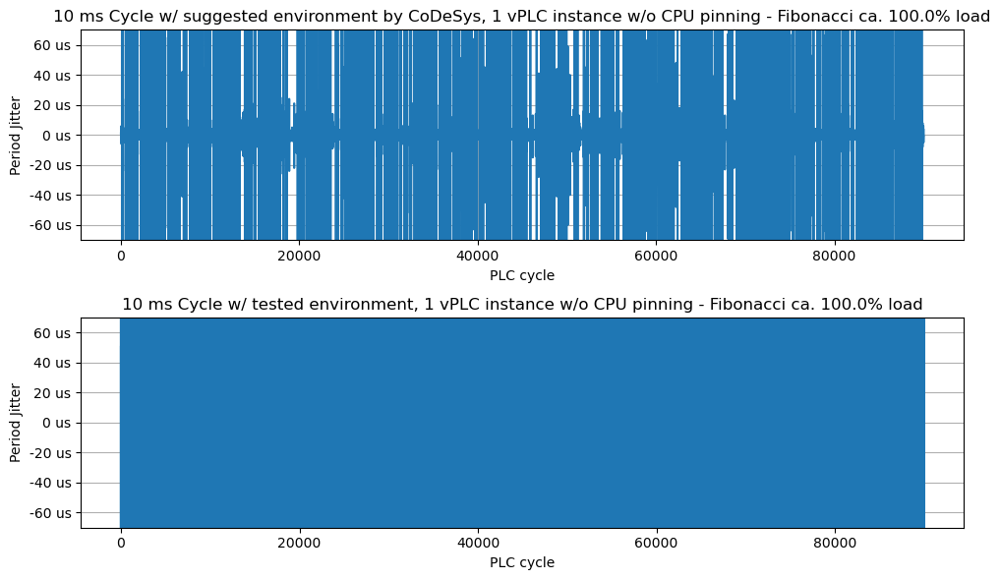

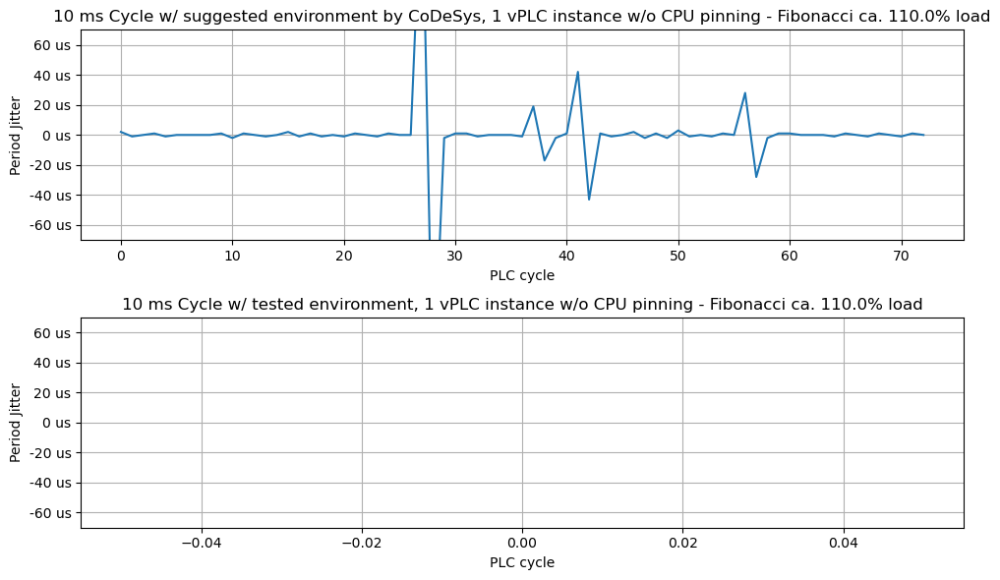

In [5]:
#un’istanza vplc senza pinning
#configurazioni a confronto: la 11 con quella di codesys
#metto qui i due percorsi
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-increase-4cpu-freerun")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-increase-3cpu-freerun")
val=90000 
k=300
jitterCodesys=[]
jitterNewConf=[]
jitterTot=[]
#prendo tutti i log della configurazione codesys
for f in sorted(os.listdir(conf_codesys)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultCodesys = load_jitter2(conf_codesys, f)
        jitterCodesys+=resultCodesys
        print(f)
        
if os.path.exists(conf_codesys + "/" + "tasktimes.log"):
    resultCodesys = load_jitter2(conf_codesys, f)
    jitterCodesys+=resultCodesys
    print("tasktimes.log")
    
print(len(jitterCodesys))

#prendo tutti i log della configurazione 11
for f in sorted(os.listdir(conf_new)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultNewConf = load_jitter2(conf_new, f)
        jitterNewConf+=resultNewConf
        print(f)
        
if os.path.exists(conf_new + "/" + "tasktimes.log"):
    resultNewConf = load_jitter2(conf_new, f)
    jitterNewConf+=resultNewConf
    print("tasktimes.log")

print(len(jitterNewConf))

#prendo la y massima

jitterTot=jitterCodesys+jitterNewConf
print(len(jitterTot))
maxTot=max(jitterTot)

#stampo le due configurazioni nello stesso grafico 
for i in range(1, max(len(jitterNewConf), len(jitterCodesys)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=jitterCodesys[i:i+val]
    resultNewConf=jitterNewConf[i:i+val]
  
    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('10 ms Cycle w/ suggested environment by CoDeSys, 1 vPLC instance w/o CPU pinning - Fibonacci ca. ' + str(k/10.0) + '% load')

    plt.xlabel('PLC cycle')
    plt.ylabel('Period Jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(-70,70)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('10 ms Cycle w/ tested environment, 1 vPLC instance w/o CPU pinning - Fibonacci ca. ' + str(k/10.0) + '% load')
    
    plt.xlabel('PLC cycle')
    plt.ylabel('Period Jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(-70,70)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.savefig('fiboinc1cpu-' + str(k) + '-nopin.png')
    plt.show()
    k=k+100


tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
720592
tasktimesCon2_0.log
tasktimesCon2_1.log
tasktimesCon2_2.log
tasktimesCon2_3.log
720553
tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
635026
tasktimesCon2_0.log
tasktimesCon2_1.log
tasktimesCon2_2.log
tasktimesCon2_3.log
720525
2796696


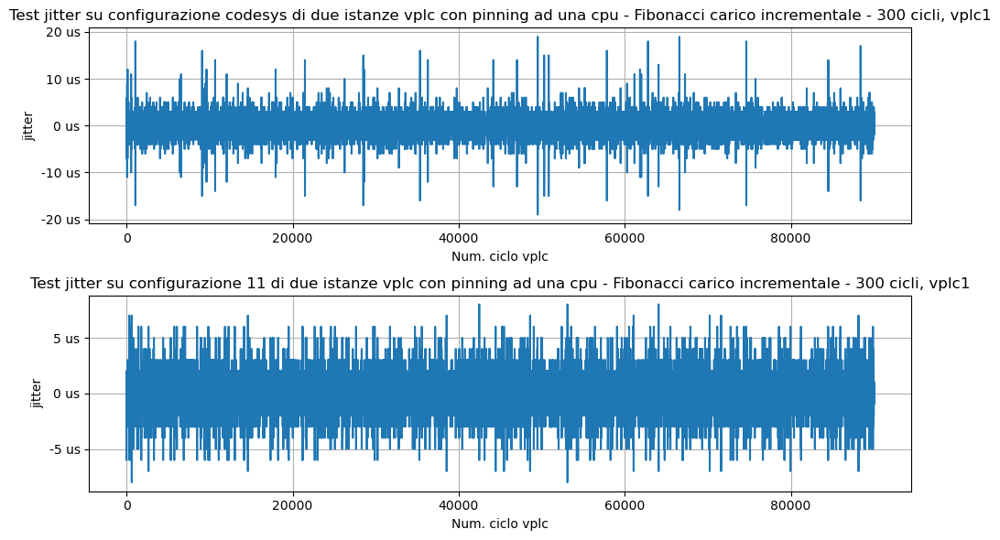

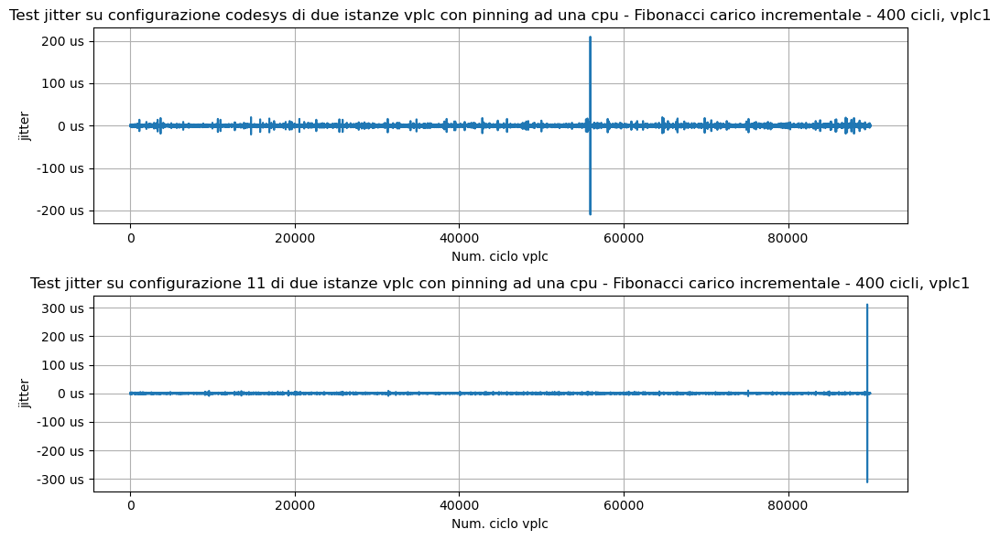

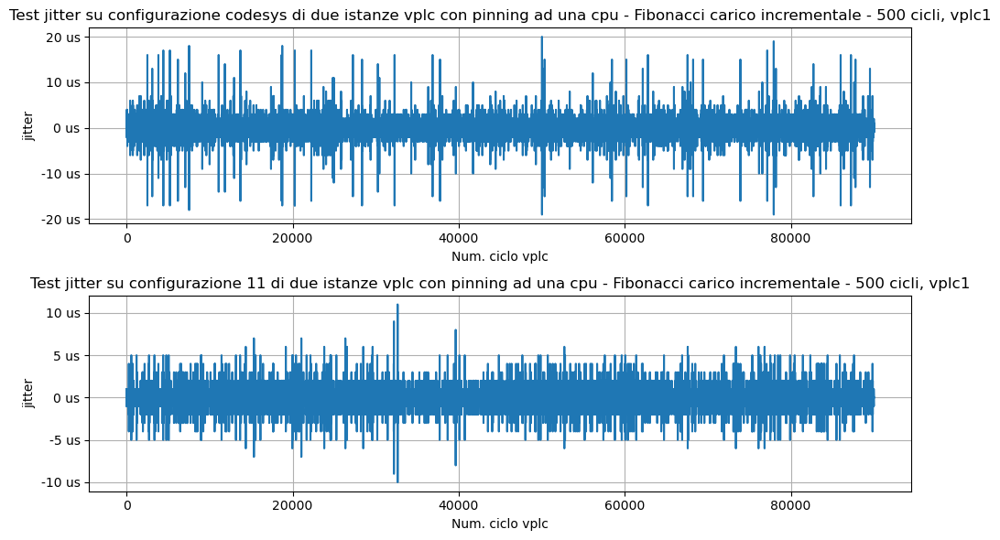

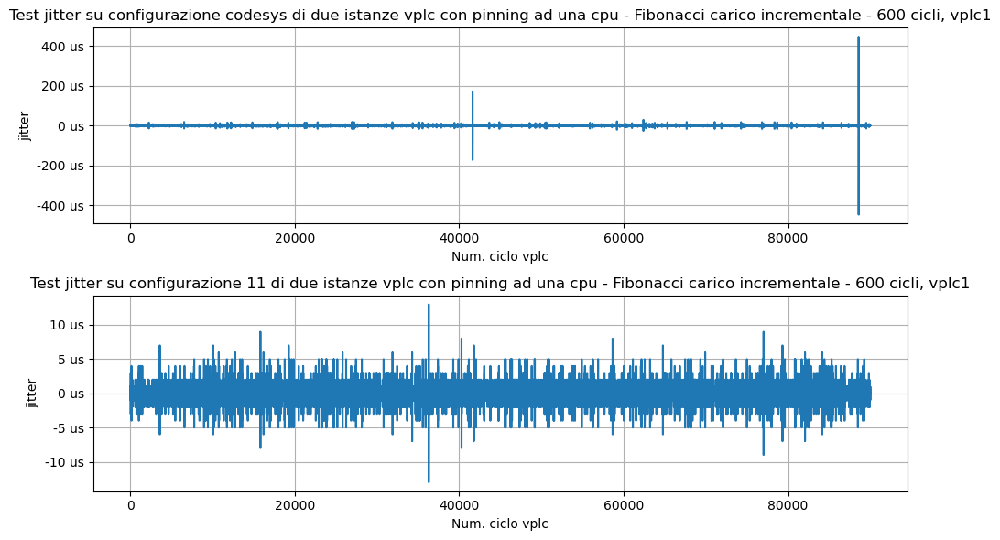

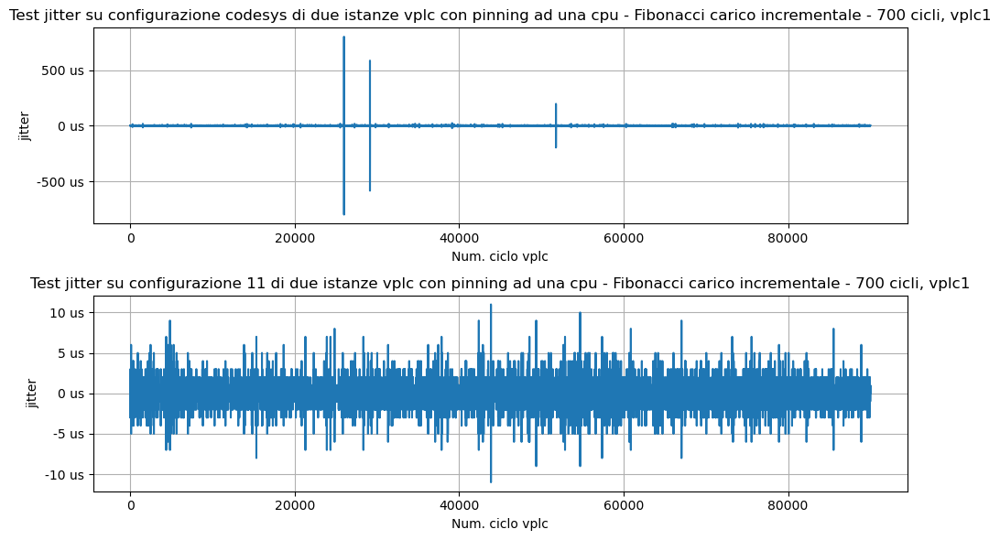

...

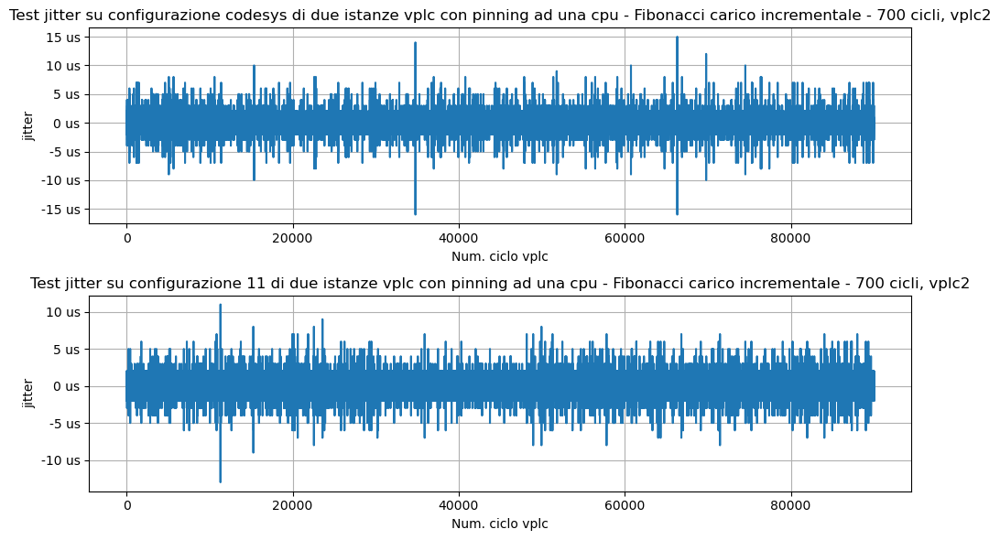

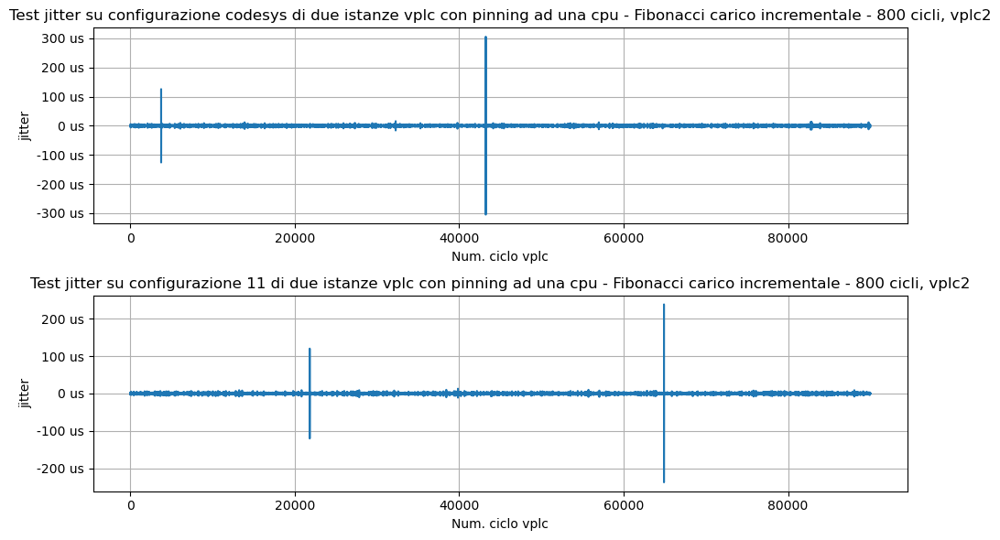

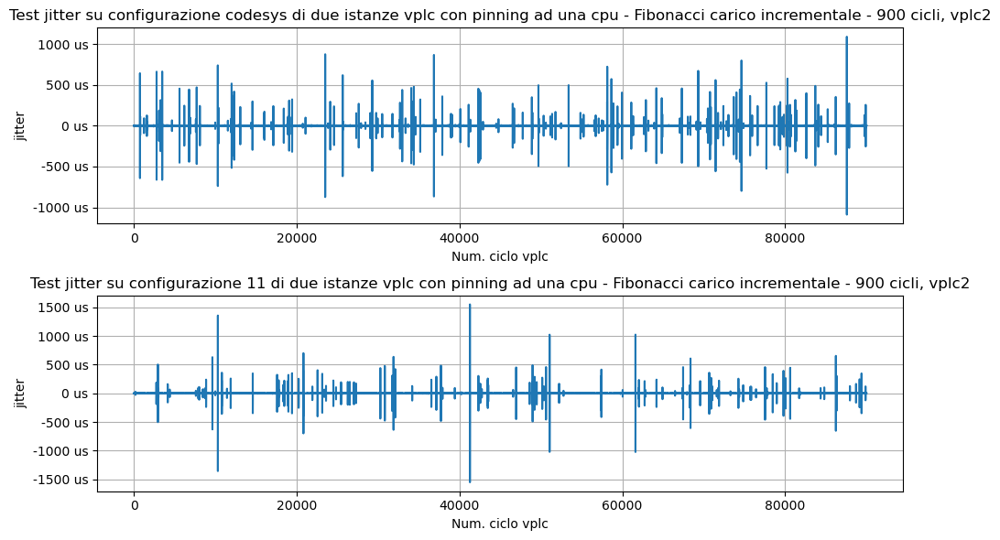

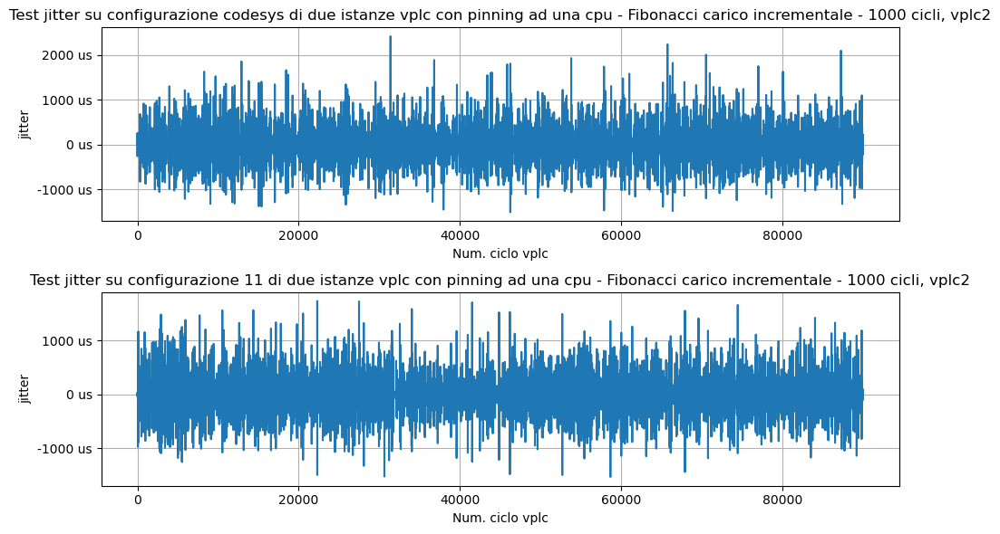

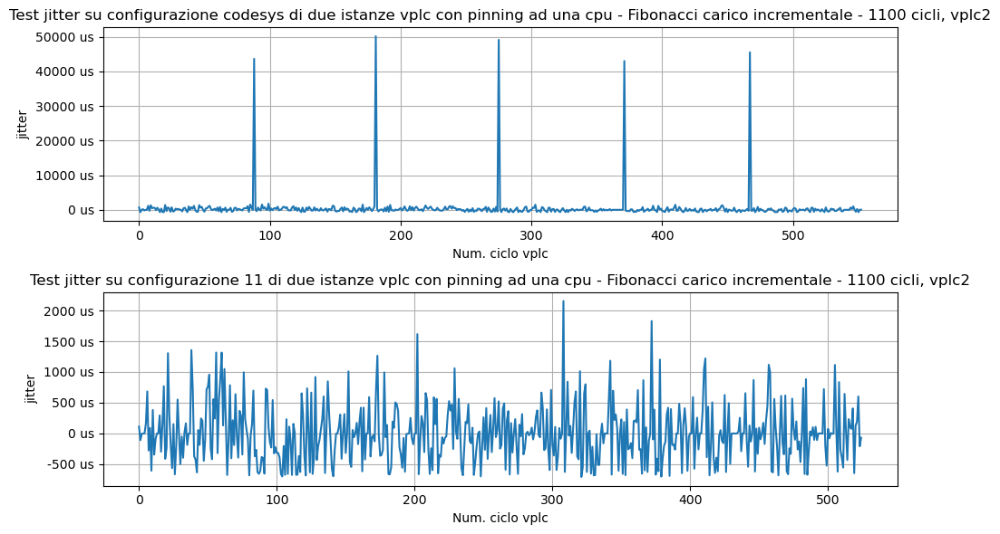

In [10]:
#due istanze vplc con pinning ad una cpu
#configurazioni a confronto: la 11 con quella di codesys
#metto qui i due percorsi
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-increase-2-4cpu-pin")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-increase-2-2cpu-pin")
val=90000 
k=300
jitterCodesys1=[]
jitterCodesys2=[]
jitterNewConf1=[]
jitterNewConf2=[]
jitterTot=[]
#prendo tutti i log della configurazione codesys
for f in sorted(os.listdir(conf_codesys)):
    if f.startswith("tasktimes") and "Con1" in f:
        resultCodesys = load_jitter2(conf_codesys, f)
        jitterCodesys1+=resultCodesys
        print(f)
    
print(len(jitterCodesys1))

for f in sorted(os.listdir(conf_codesys)):
    if f.startswith("tasktimes") and "Con2" in f:
        resultCodesys = load_jitter2(conf_codesys, f)
        jitterCodesys2+=resultCodesys
        print(f)
    
print(len(jitterCodesys2))

#prendo tutti i log della configurazione 11
for f in sorted(os.listdir(conf_new)):
    if f.startswith("tasktimes") and "Con1" in f:
        resultNewConf = load_jitter2(conf_new, f)
        jitterNewConf1+=resultNewConf
        print(f)

print(len(jitterNewConf1))

for f in sorted(os.listdir(conf_new)):
    if f.startswith("tasktimes") and "Con2" in f:
        resultNewConf = load_jitter2(conf_new, f)
        jitterNewConf2+=resultNewConf
        print(f)

print(len(jitterNewConf2))

#prendo la y massima

jitterTot=jitterCodesys1+jitterCodesys2+jitterNewConf1+jitterNewConf2
print(len(jitterTot))
maxTot=max(jitterTot)

#stampo le due configurazioni nello stesso grafico 
for i in range(1, max(len(jitterNewConf1), len(jitterCodesys1)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=jitterCodesys1[i:i+val]
    resultNewConf=jitterNewConf1[i:i+val]
  

    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('Test jitter su configurazione codesys di due istanze vplc con pinning ad una cpu - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc1')

    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    #plt.ylim(0,maxTot)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('Test jitter su configurazione 11 di due istanze vplc con pinning ad una cpu - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc1')
    
    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    #plt.ylim(0,maxTot)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.show()
    k=k+100

#stampo le due configurazioni nello stesso grafico 
k=300
for i in range(0, max(len(jitterNewConf2), len(jitterCodesys2)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=jitterCodesys2[i:i+val]
    resultNewConf=jitterNewConf2[i:i+val]

    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('Test jitter su configurazione codesys di due istanze vplc con pinning ad una cpu - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc2')

    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    #plt.ylim(0,maxTot)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('Test jitter su configurazione 11 di due istanze vplc con pinning ad una cpu - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc2')
    
    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    #plt.ylim(0,maxTot)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.show()
    k=k+100



tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
720062
tasktimesCon2_0.log
tasktimesCon2_1.log
tasktimesCon2_2.log
tasktimesCon2_3.log
720063
tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
720049
tasktimesCon2_0.log
tasktimesCon2_1.log
tasktimesCon2_2.log
tasktimesCon2_3.log
720067
2880241


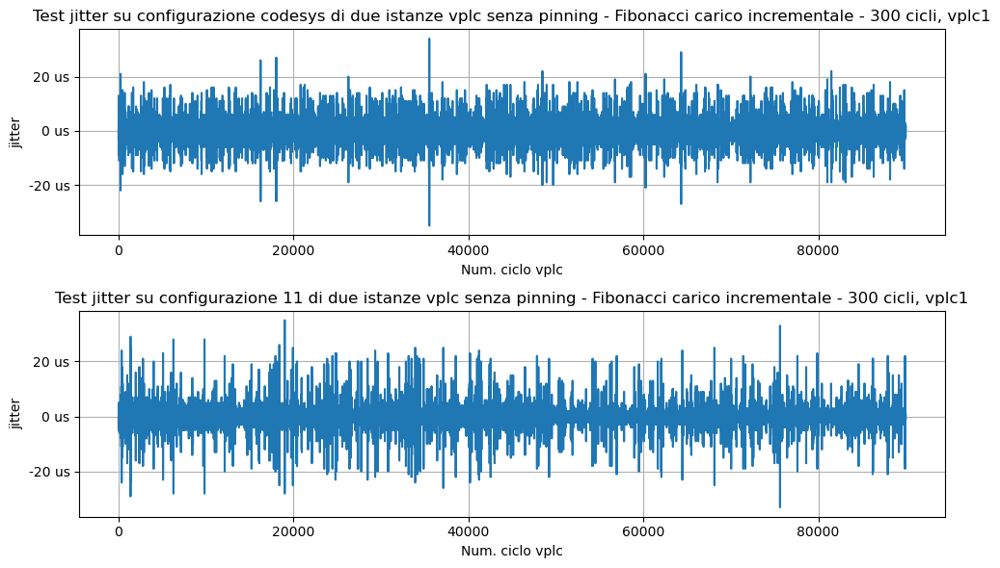

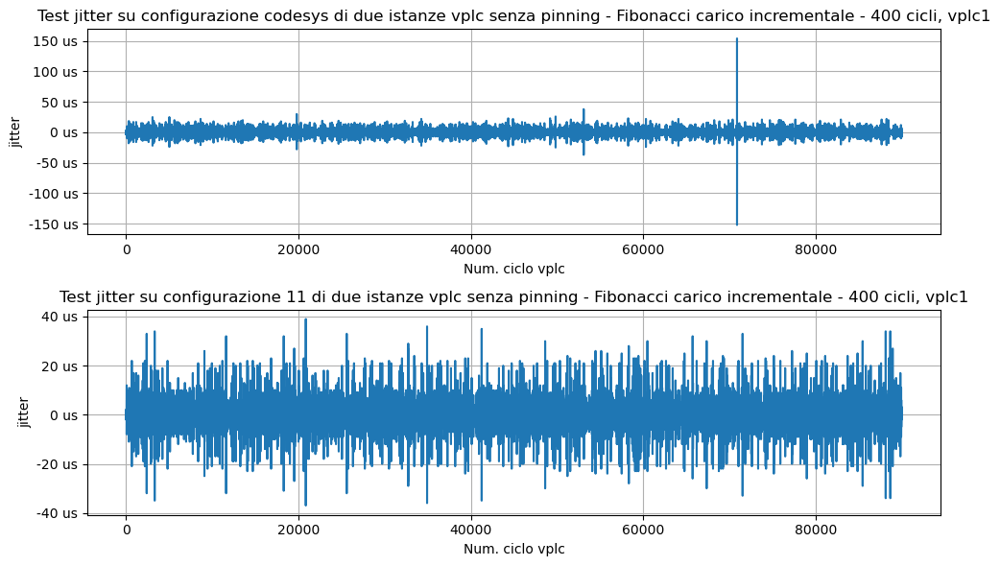

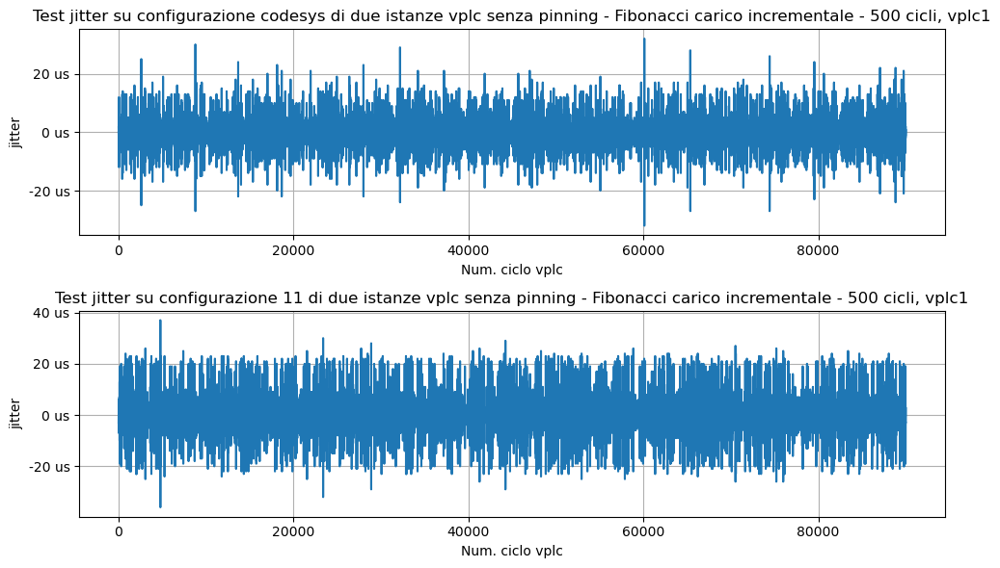

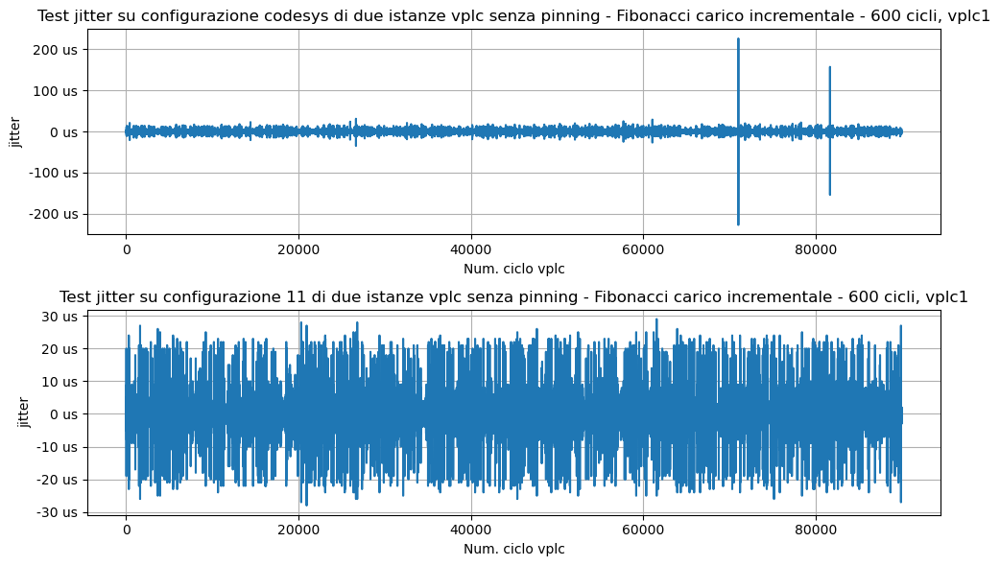

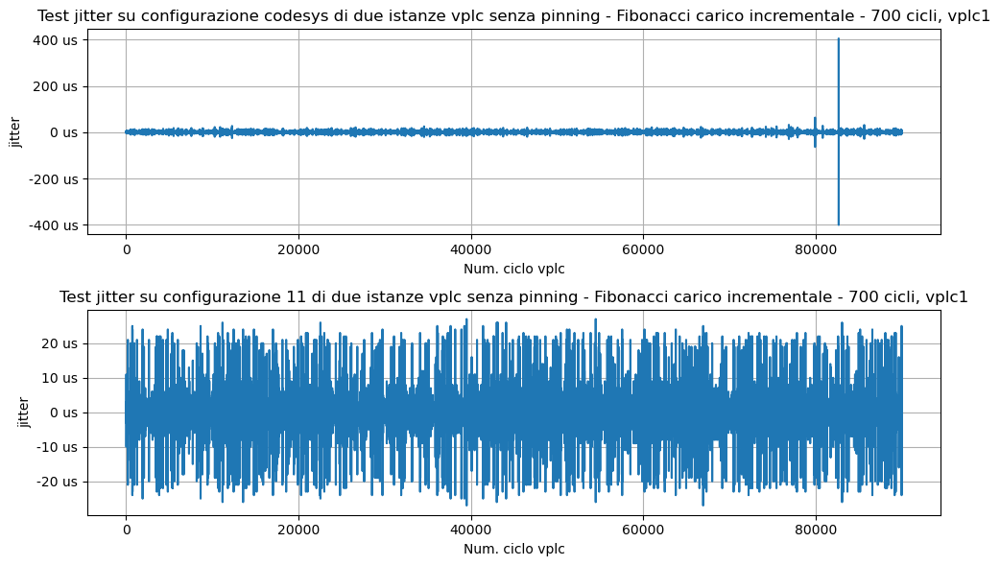

...

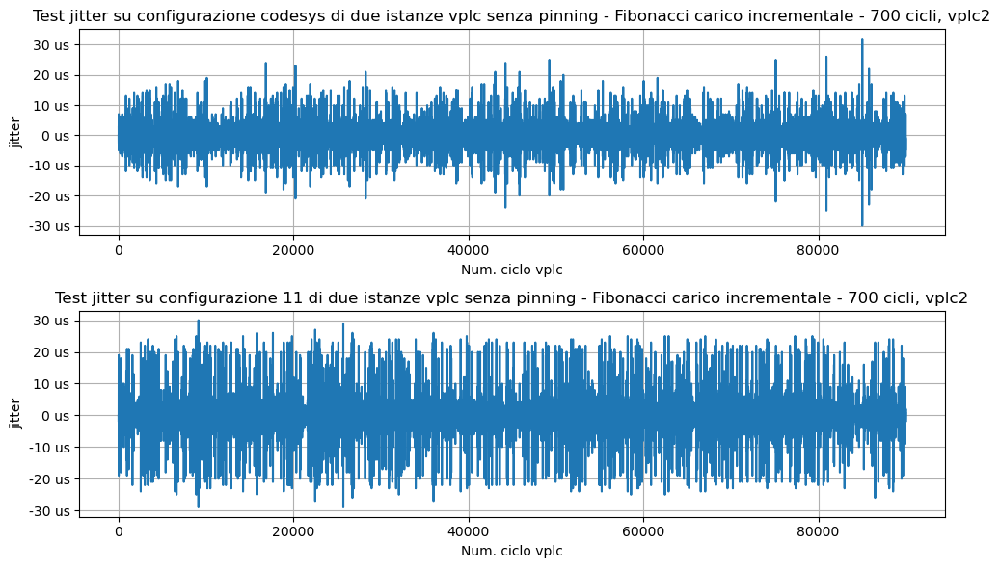

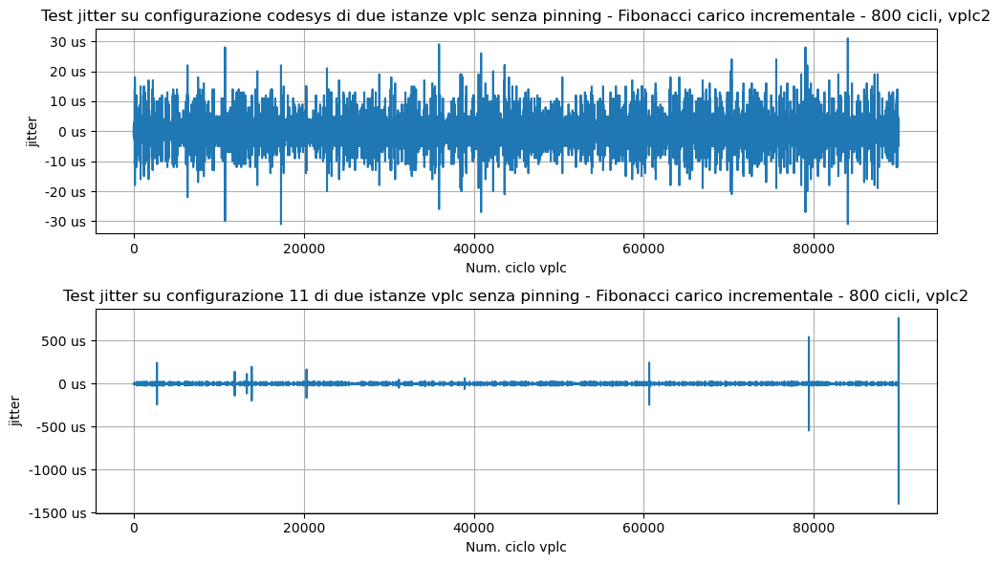

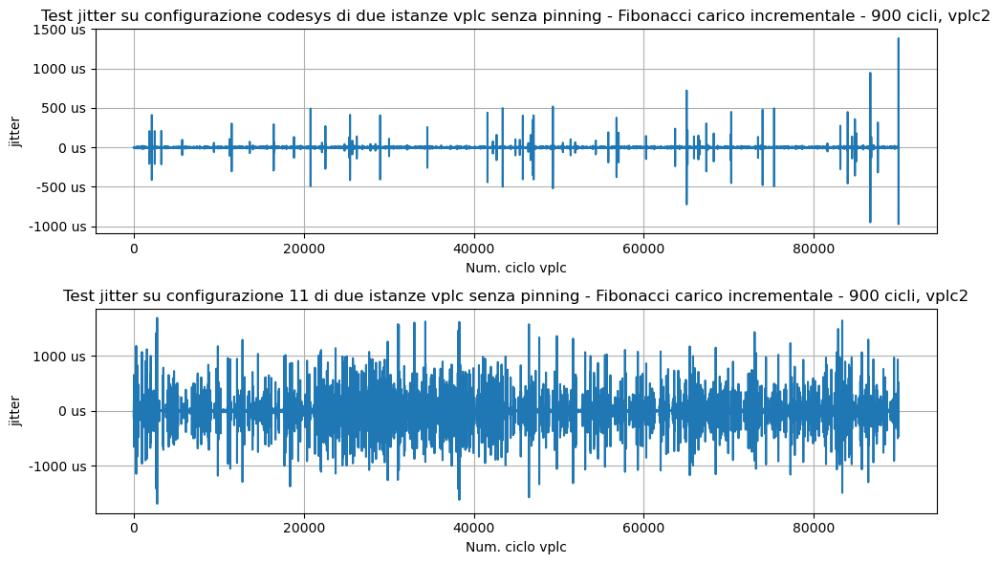

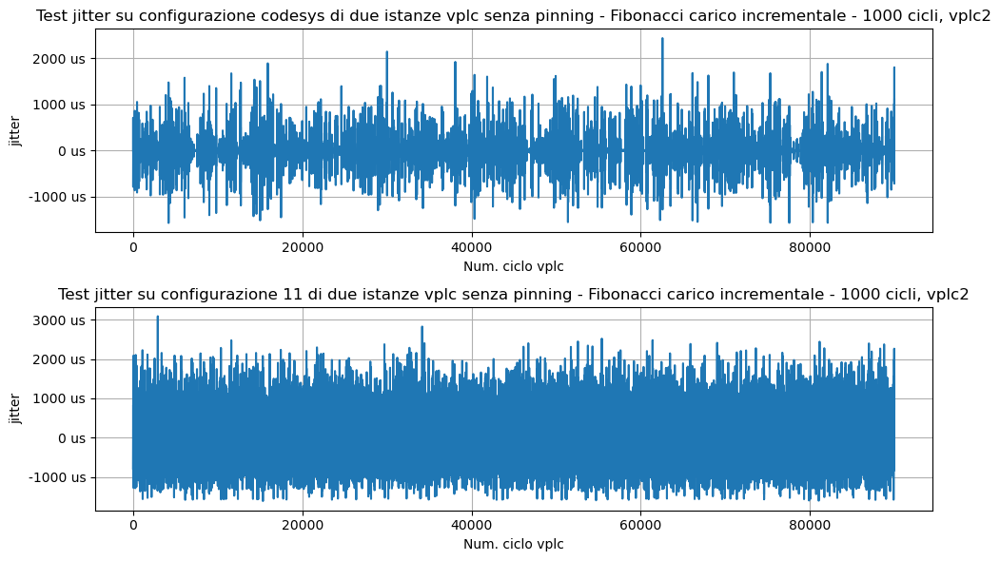

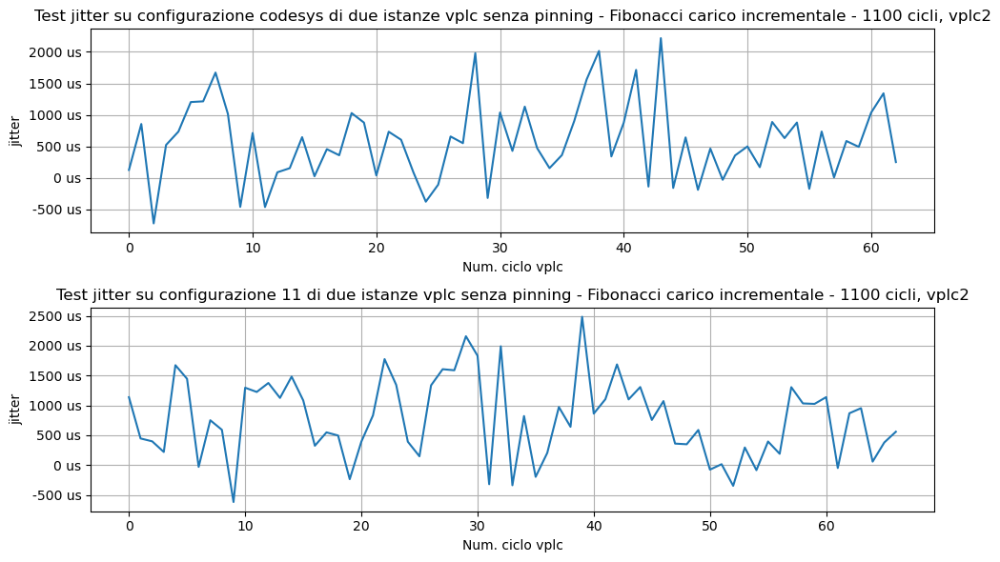

In [11]:
#due istanze vplc senza pinning
#configurazioni a confronto: la 11 con quella di codesys
#metto qui i due percorsi
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-increase-2-4cpu-freerun")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-increase-2-3cpu-freerun")
val=90000 
k=300
jitterCodesys1=[]
jitterCodesys2=[]
jitterNewConf1=[]
jitterNewConf2=[]
jitterTot=[]
#prendo tutti i log della configurazione codesys
for f in sorted(os.listdir(conf_codesys)):
    if f.startswith("tasktimes") and "Con1" in f:
        resultCodesys = load_jitter2(conf_codesys, f)
        jitterCodesys1+=resultCodesys
        print(f)
    
print(len(jitterCodesys1))

for f in sorted(os.listdir(conf_codesys)):
    if f.startswith("tasktimes") and "Con2" in f:
        resultCodesys = load_jitter2(conf_codesys, f)
        jitterCodesys2+=resultCodesys
        print(f)
    
print(len(jitterCodesys2))

#prendo tutti i log della configurazione 11
for f in sorted(os.listdir(conf_new)):
    if f.startswith("tasktimes") and "Con1" in f:
        resultNewConf = load_jitter2(conf_new, f)
        jitterNewConf1+=resultNewConf
        print(f)

print(len(jitterNewConf1))

for f in sorted(os.listdir(conf_new)):
    if f.startswith("tasktimes") and "Con2" in f:
        resultNewConf = load_jitter2(conf_new, f)
        jitterNewConf2+=resultNewConf
        print(f)

print(len(jitterNewConf2))

#prendo la y massima

jitterTot=jitterCodesys1+jitterCodesys2+jitterNewConf1+jitterNewConf2
print(len(jitterTot))
maxTot=max(jitterTot)

#stampo le due configurazioni nello stesso grafico 
for i in range(1, max(len(jitterNewConf1), len(jitterCodesys1)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=jitterCodesys1[i:i+val]
    resultNewConf=jitterNewConf1[i:i+val]
  

    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('Test jitter su configurazione codesys di due istanze vplc senza pinning - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc1')

    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
   # plt.ylim(0,maxTot)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('Test jitter su configurazione 11 di due istanze vplc senza pinning - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc1')
    
    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    #plt.ylim(0,maxTot)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.show()
    k=k+100

#stampo le due configurazioni nello stesso grafico 
k=300
for i in range(0, max(len(jitterNewConf2), len(jitterCodesys2)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=jitterCodesys2[i:i+val]
    resultNewConf=jitterNewConf2[i:i+val]

    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('Test jitter su configurazione codesys di due istanze vplc senza pinning - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc2')

    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    #plt.ylim(0,maxTot)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('Test jitter su configurazione 11 di due istanze vplc senza pinning - Fibonacci carico incrementale - ' + str(k) + ' cicli, vplc2')
    
    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
   # plt.ylim(0,maxTot)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.show()
    k=k+100



1


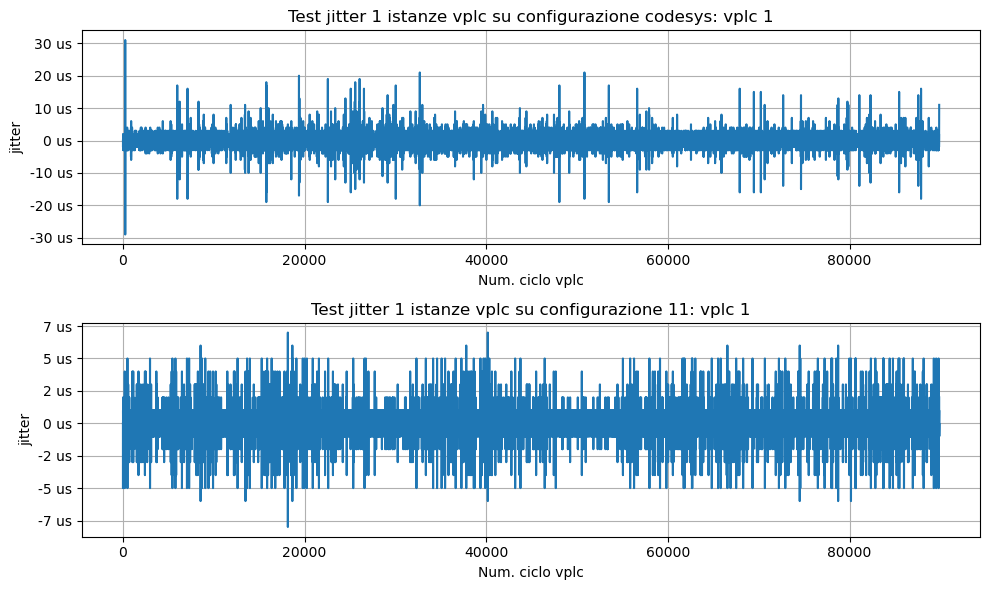

2


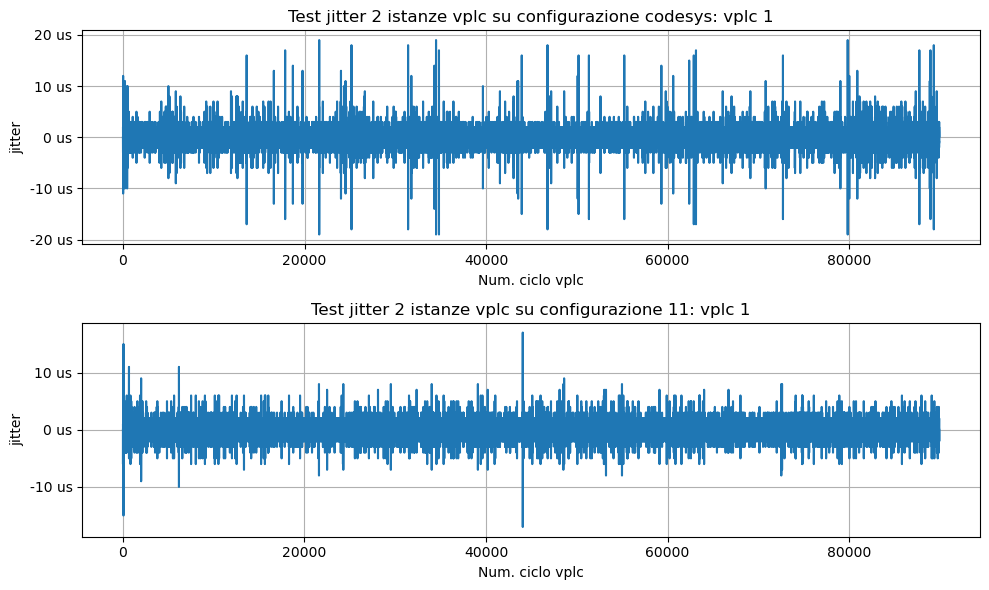

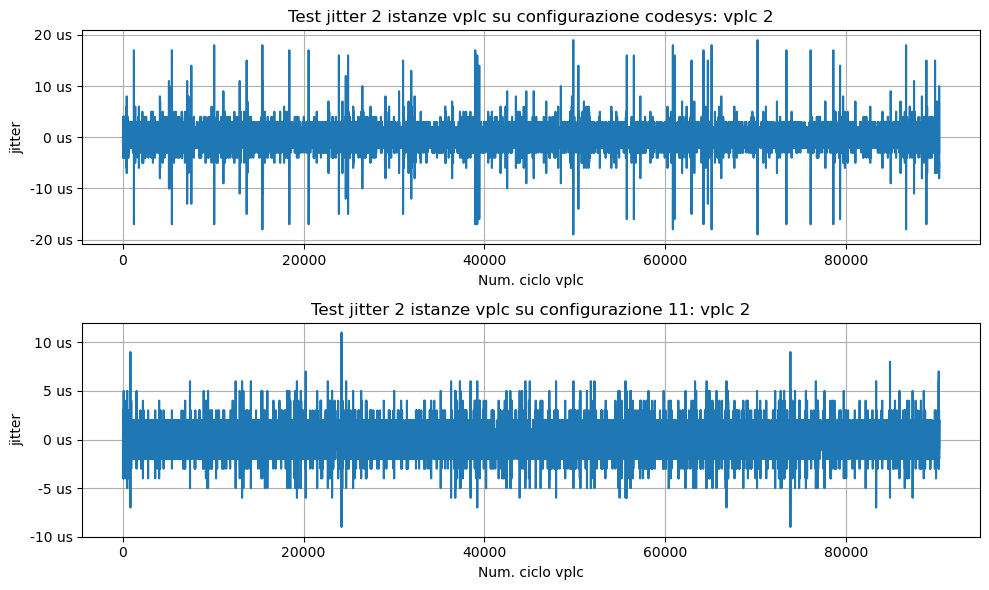

3


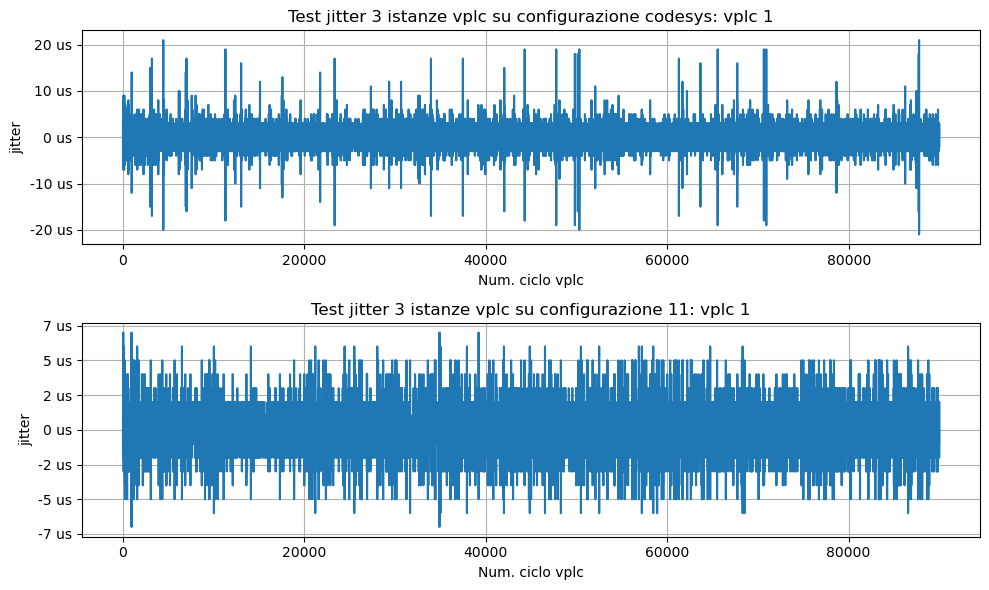

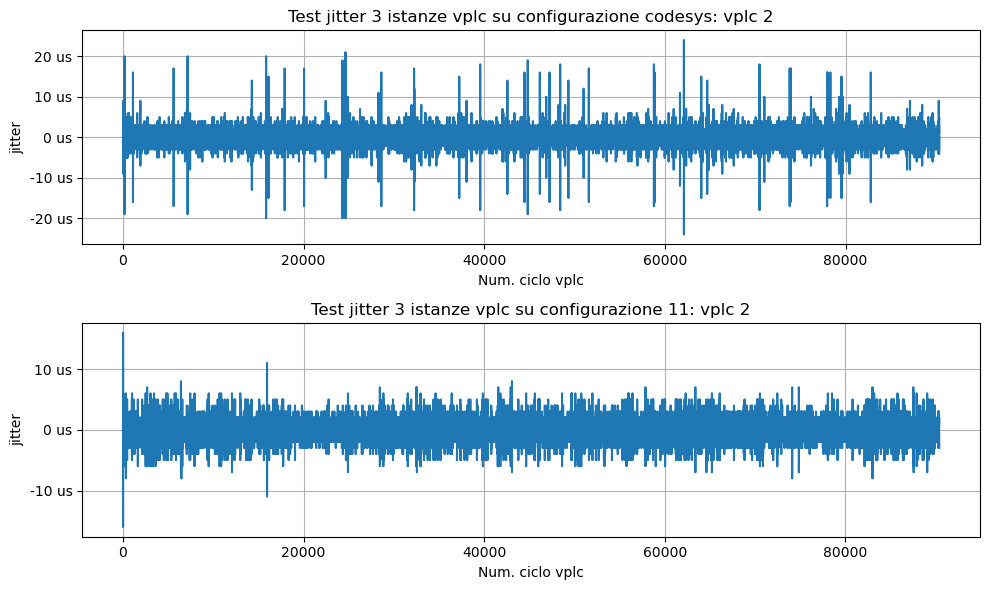

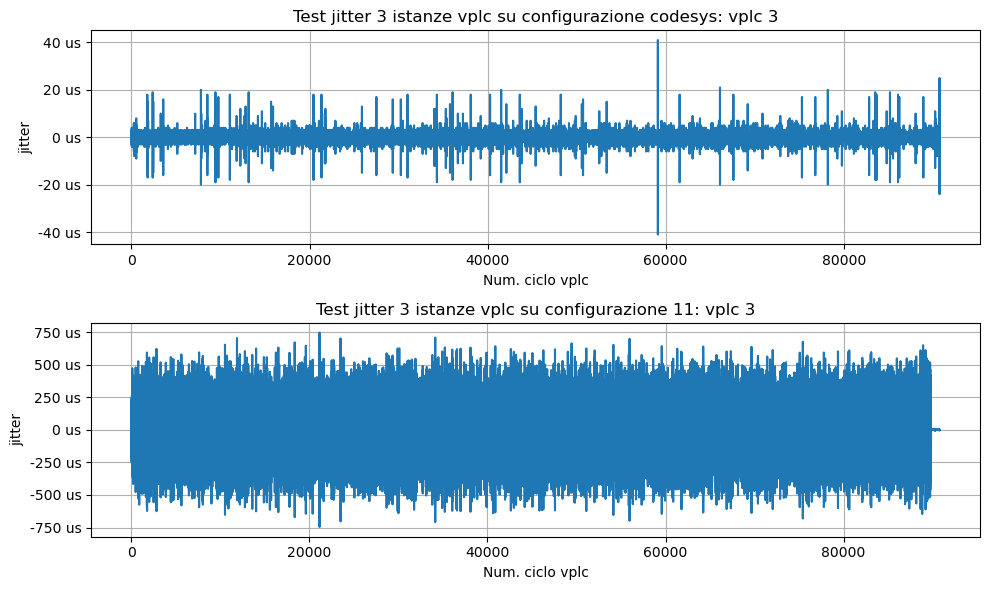

4


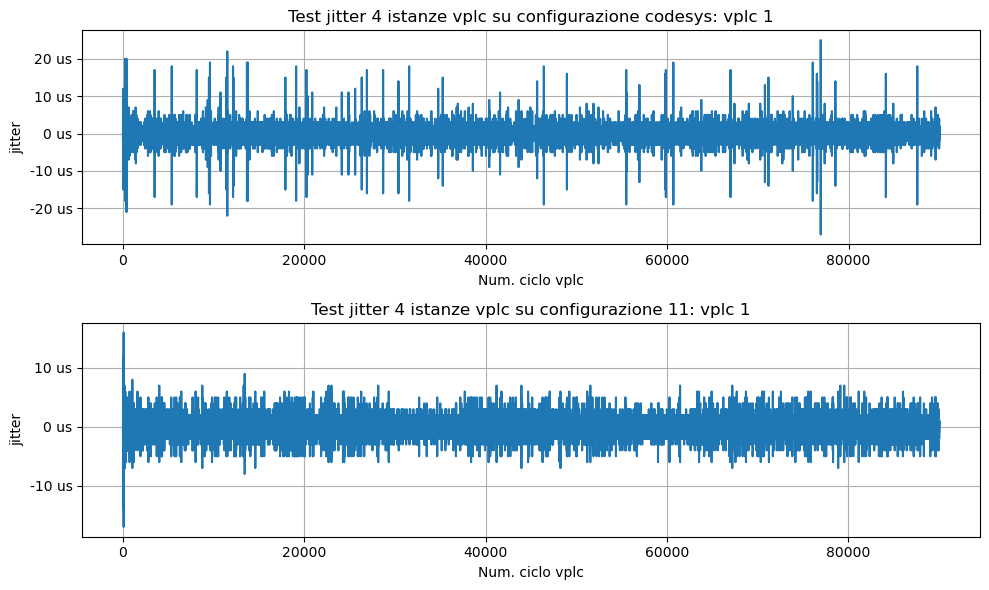

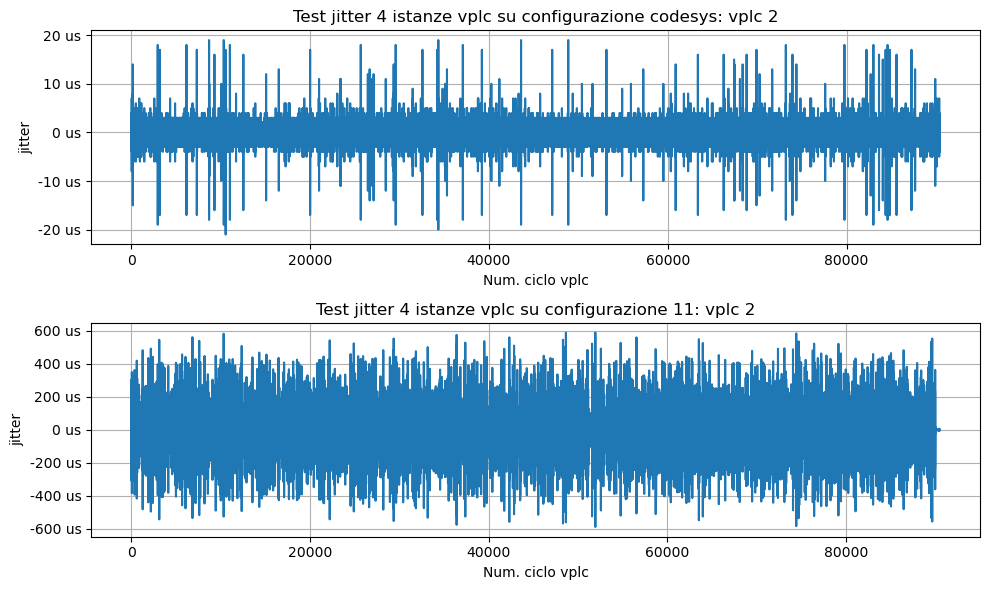

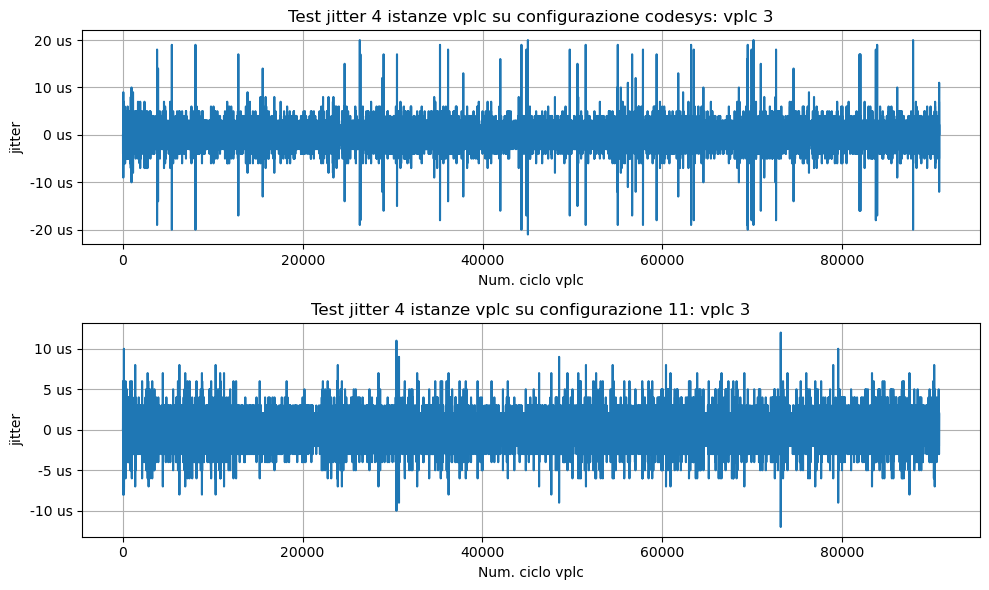

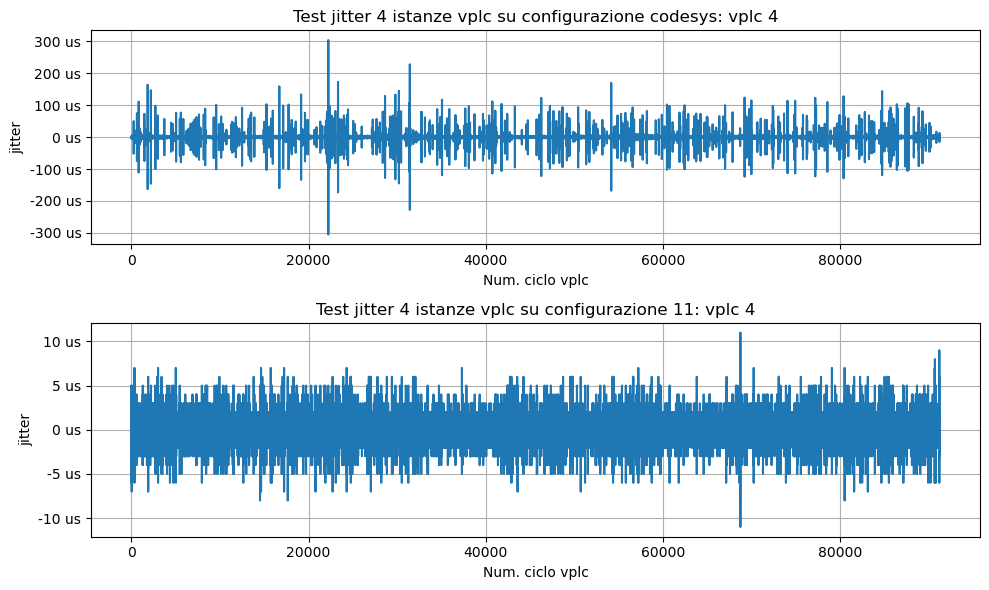

5


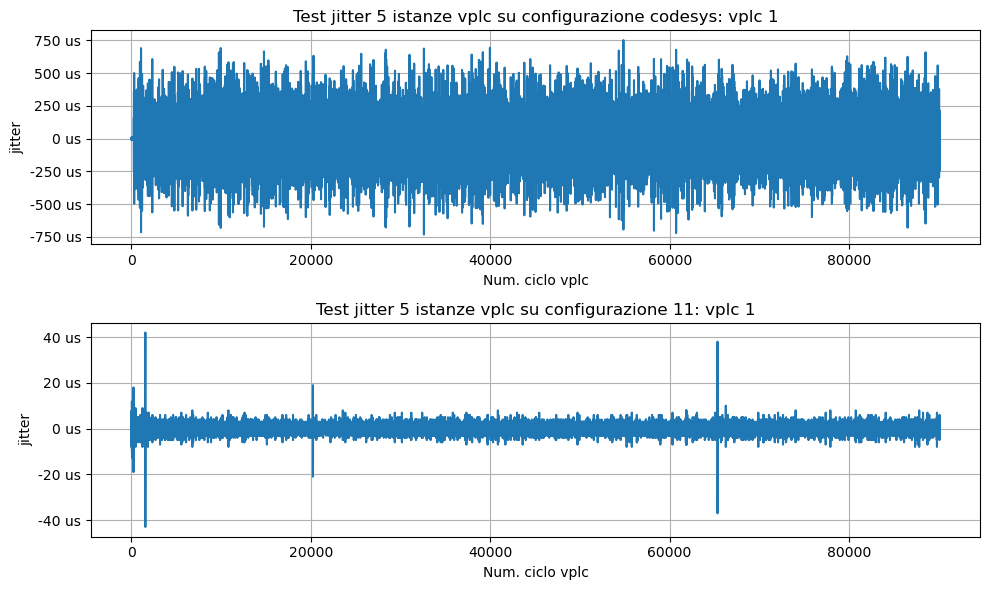

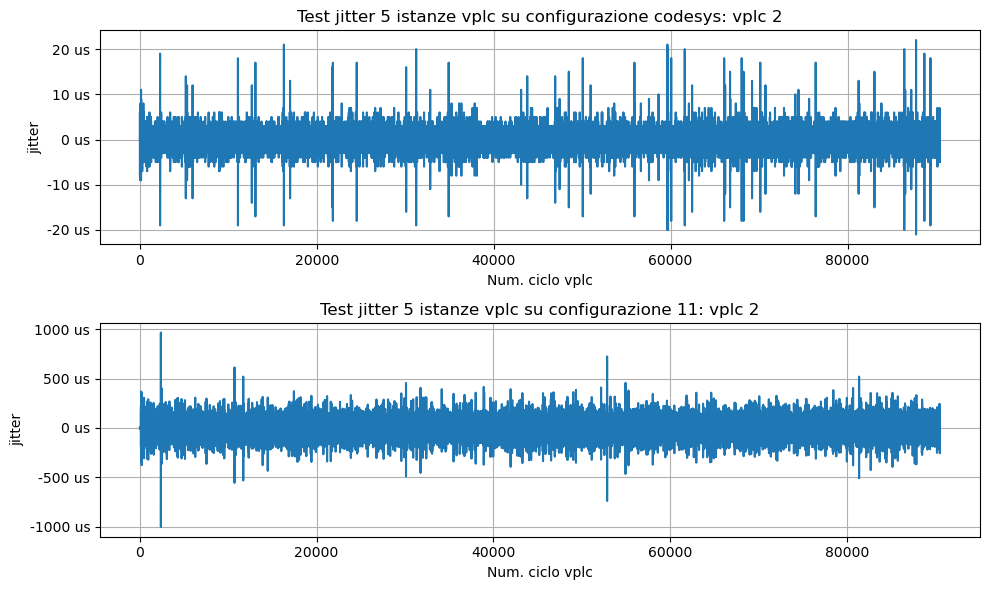

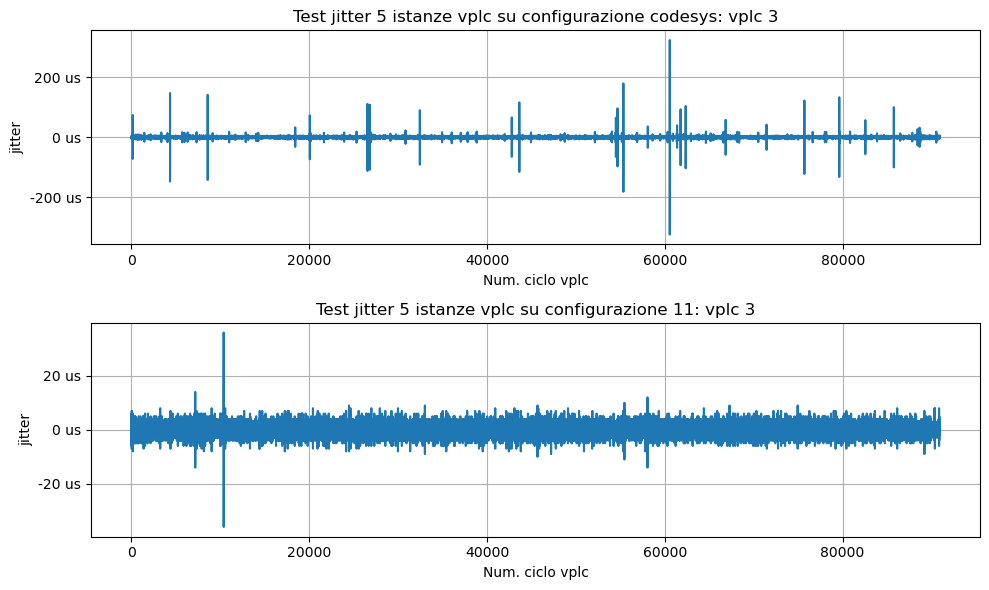

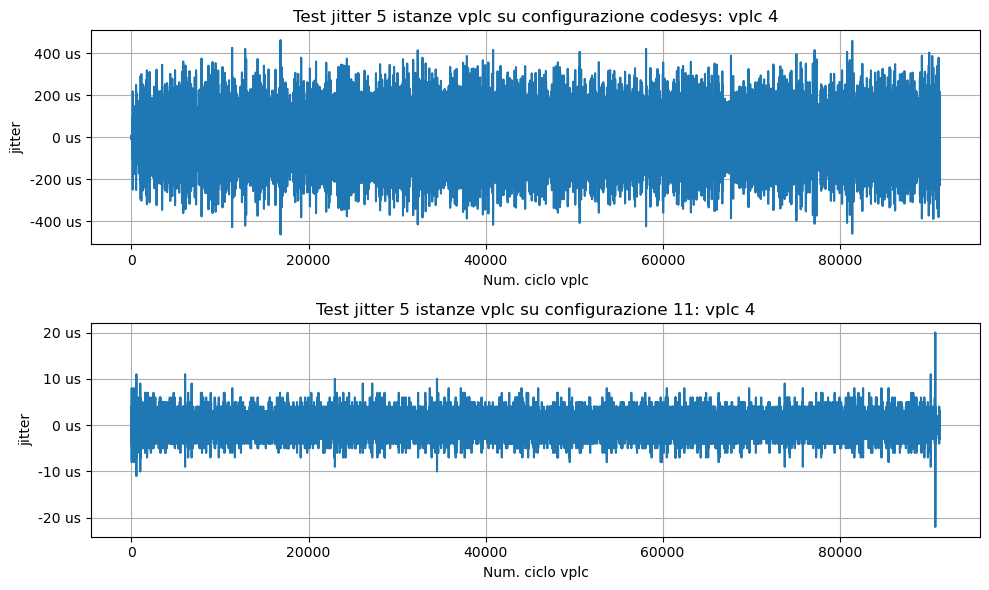

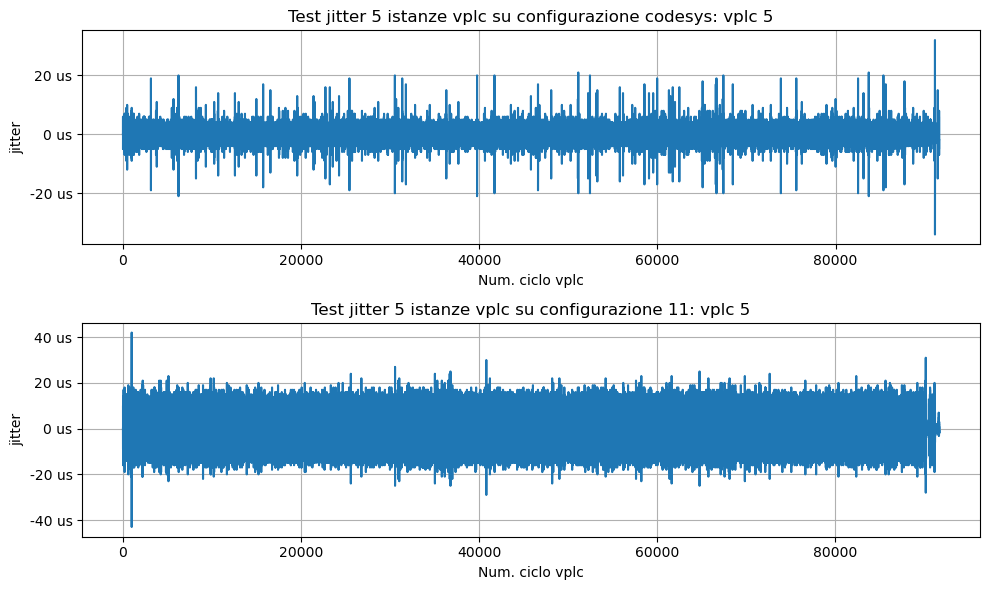

6


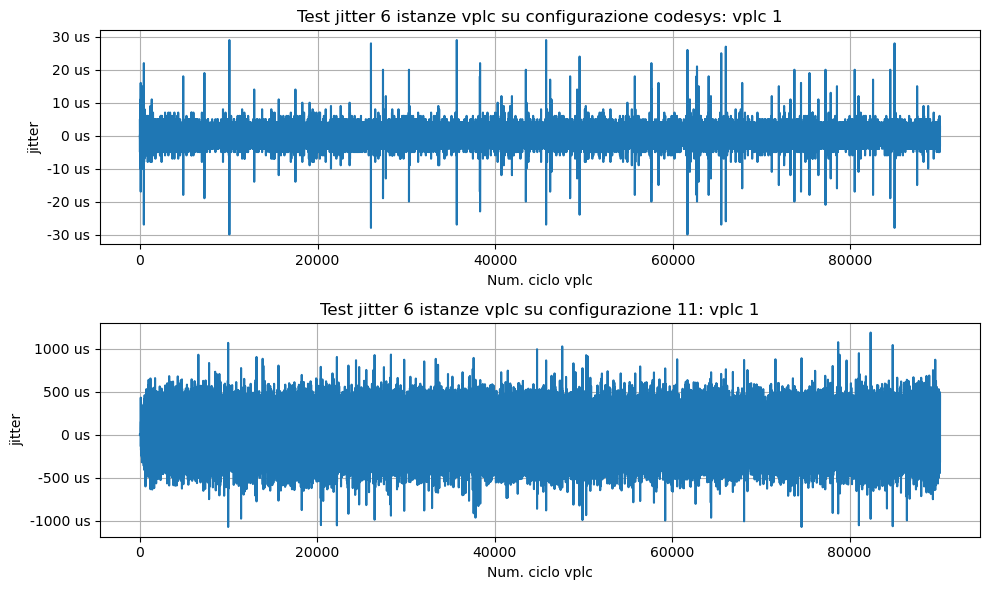

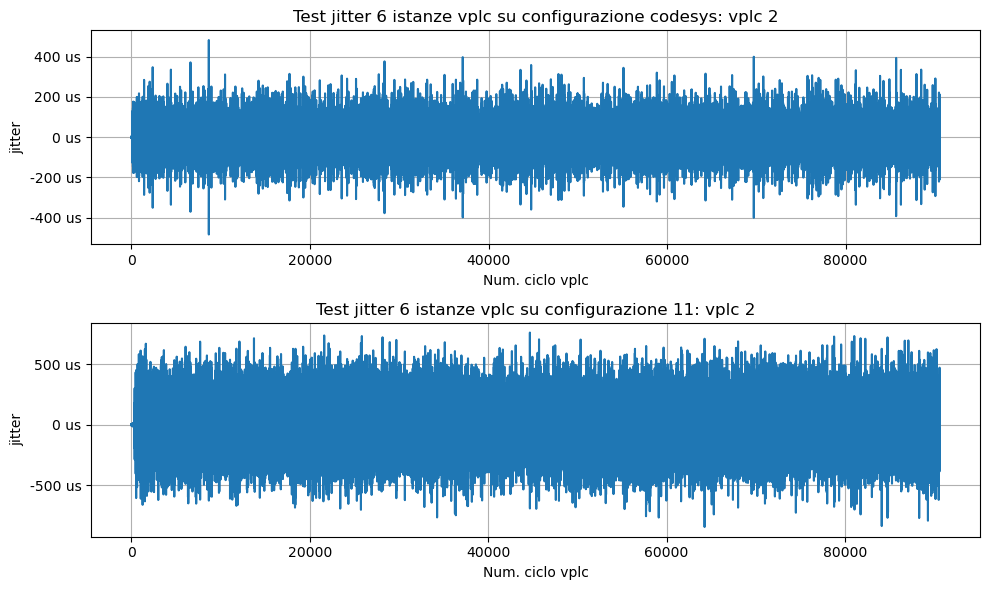

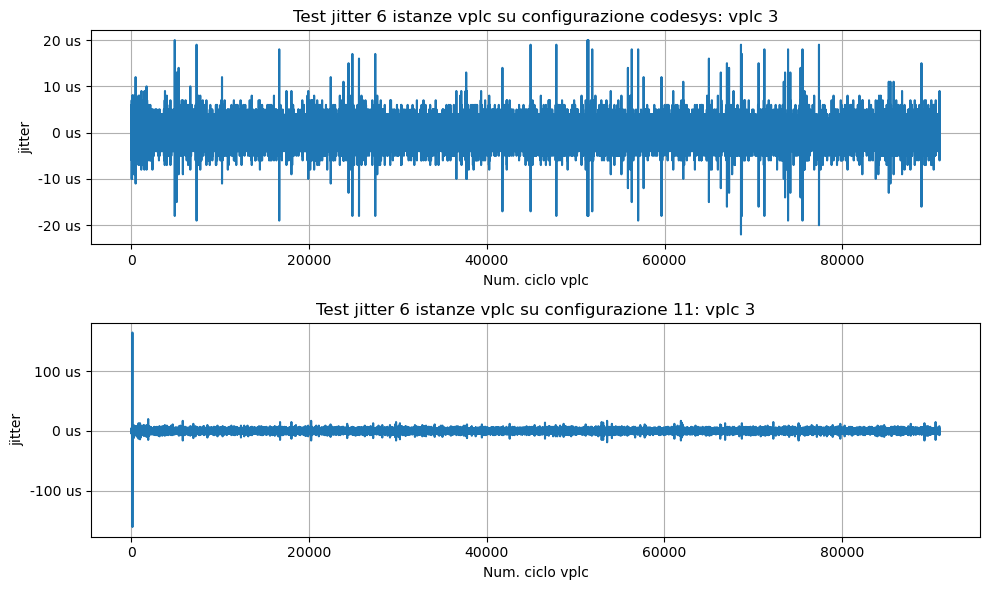

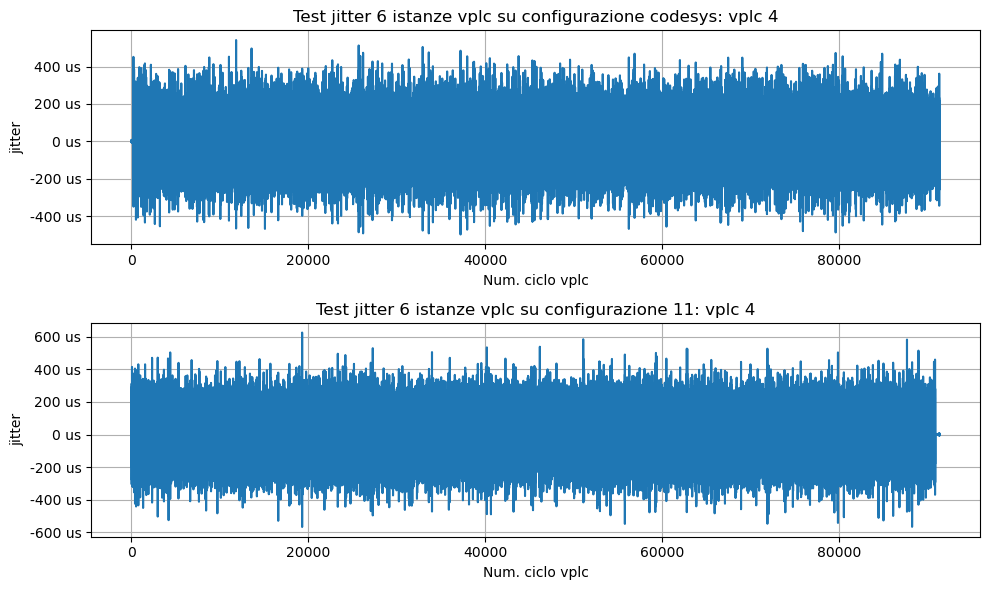

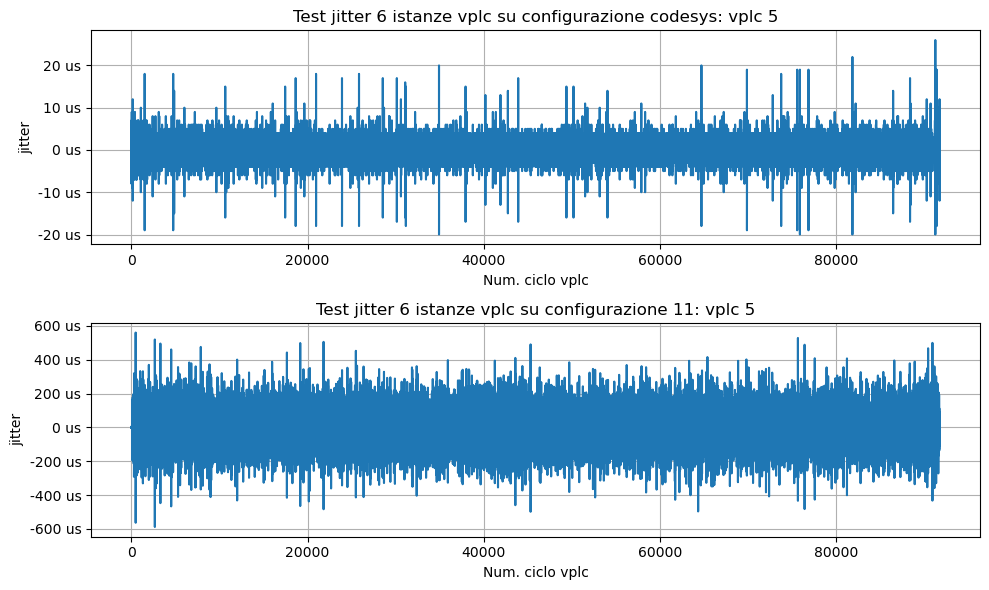

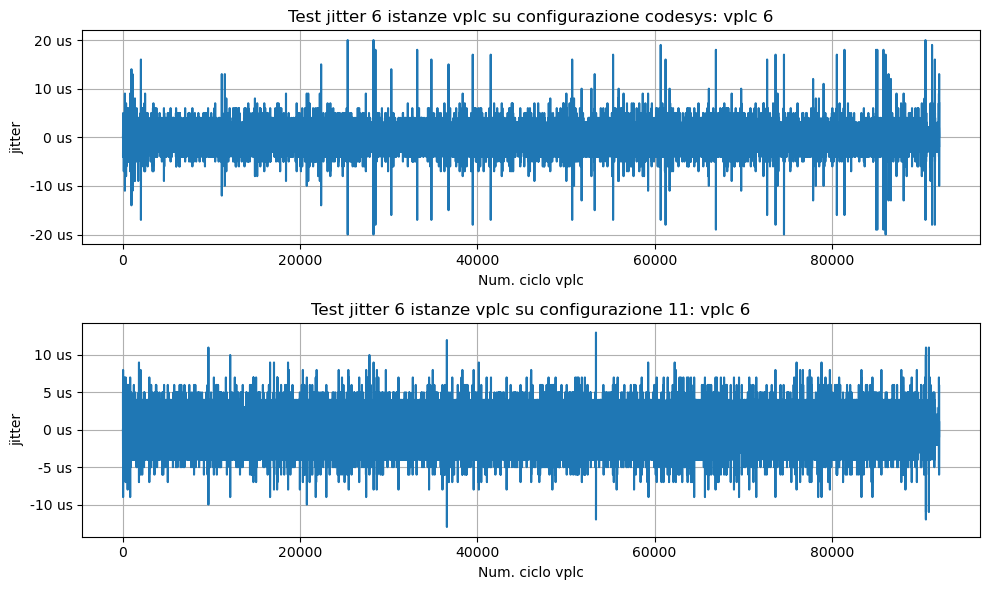

7


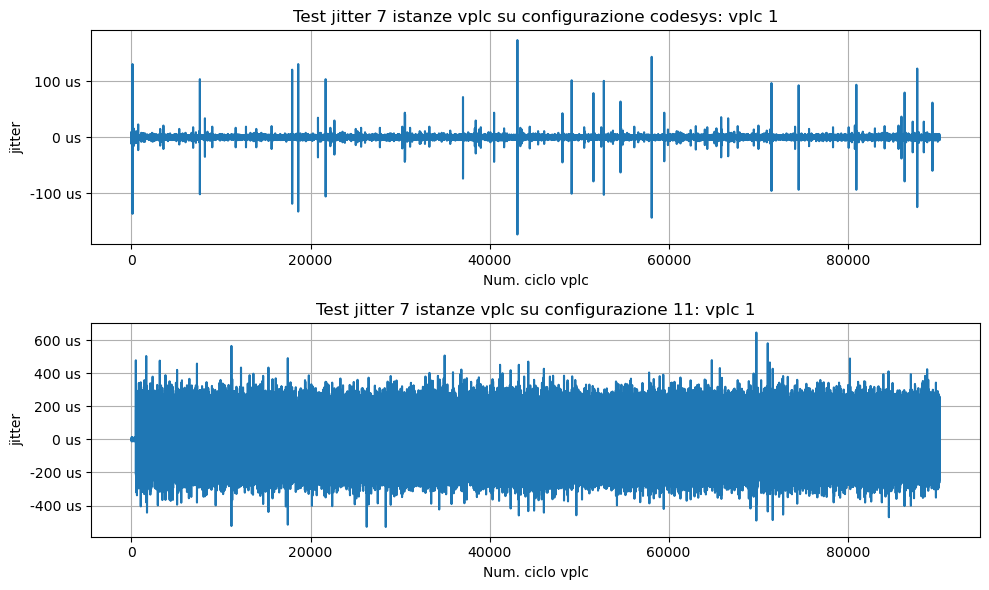

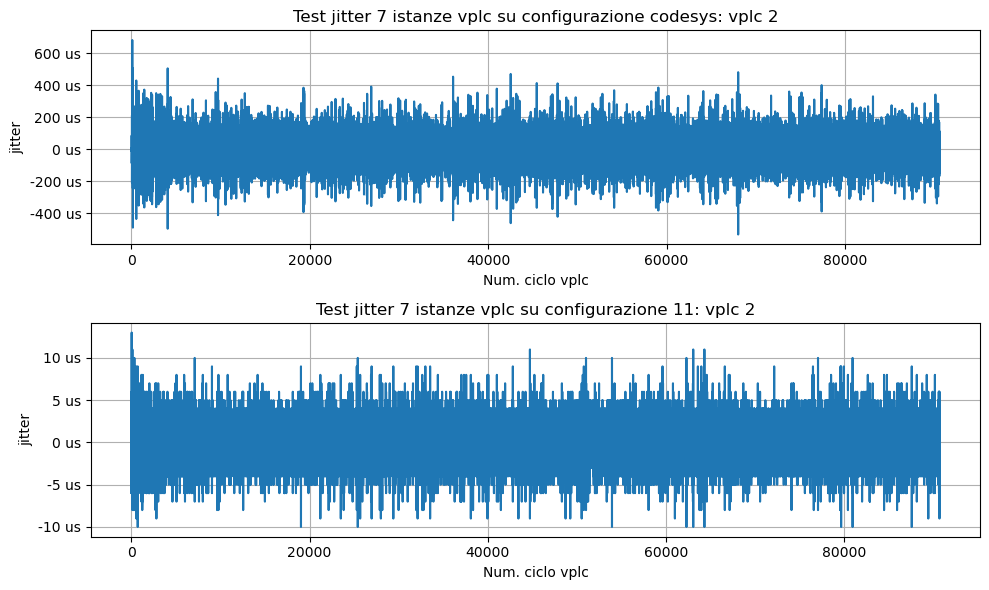

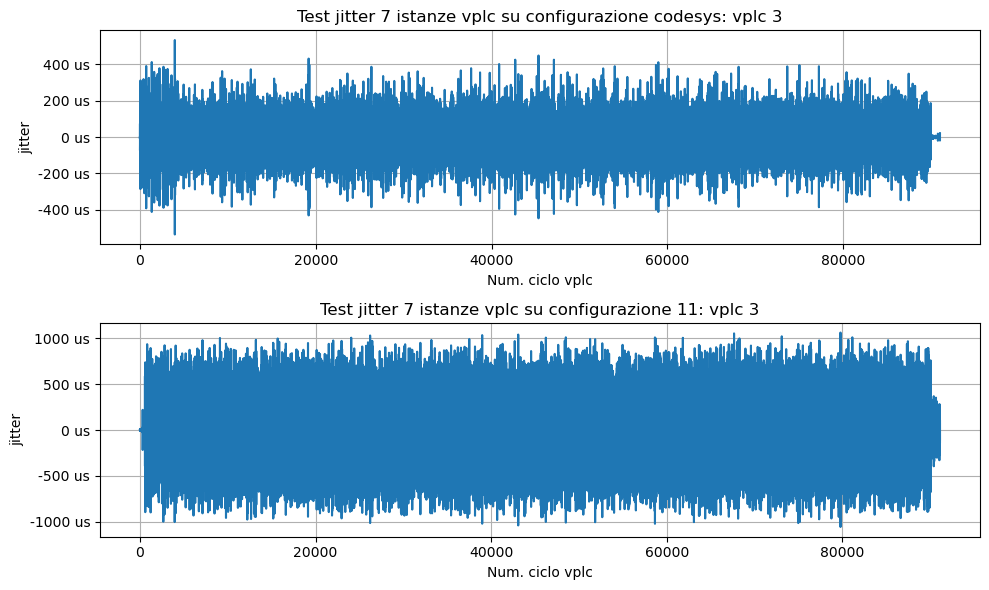

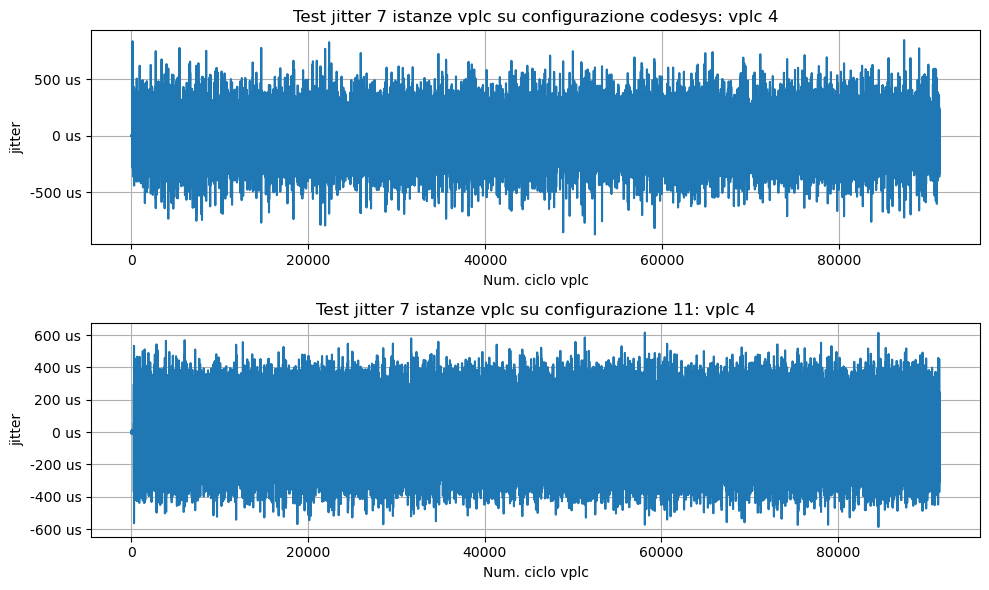

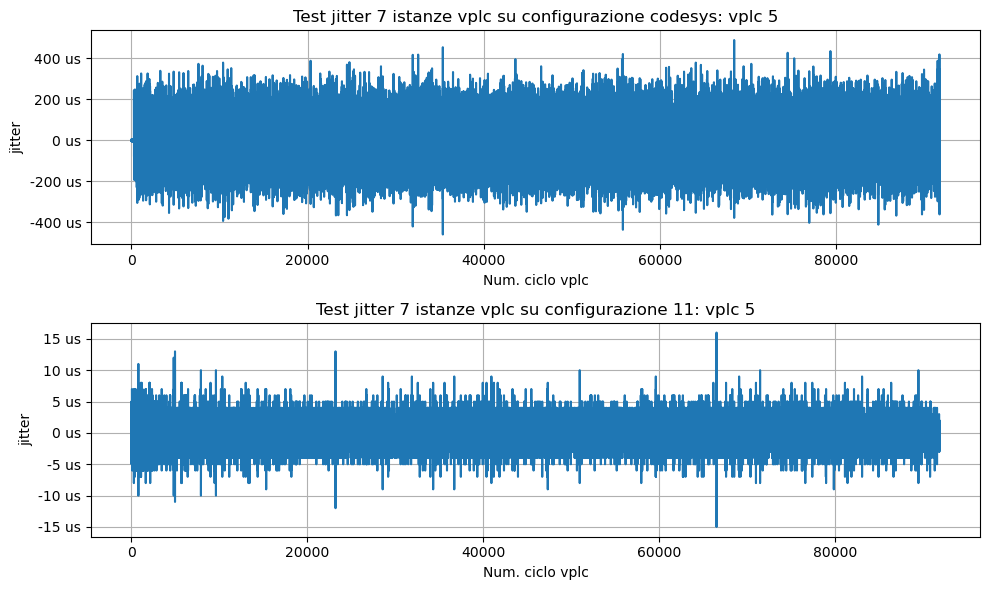

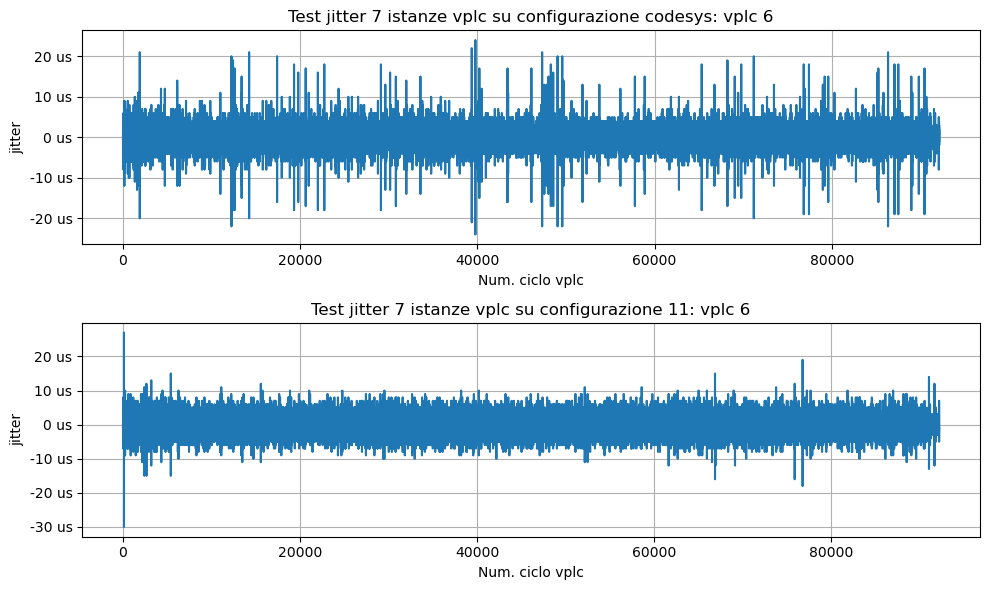

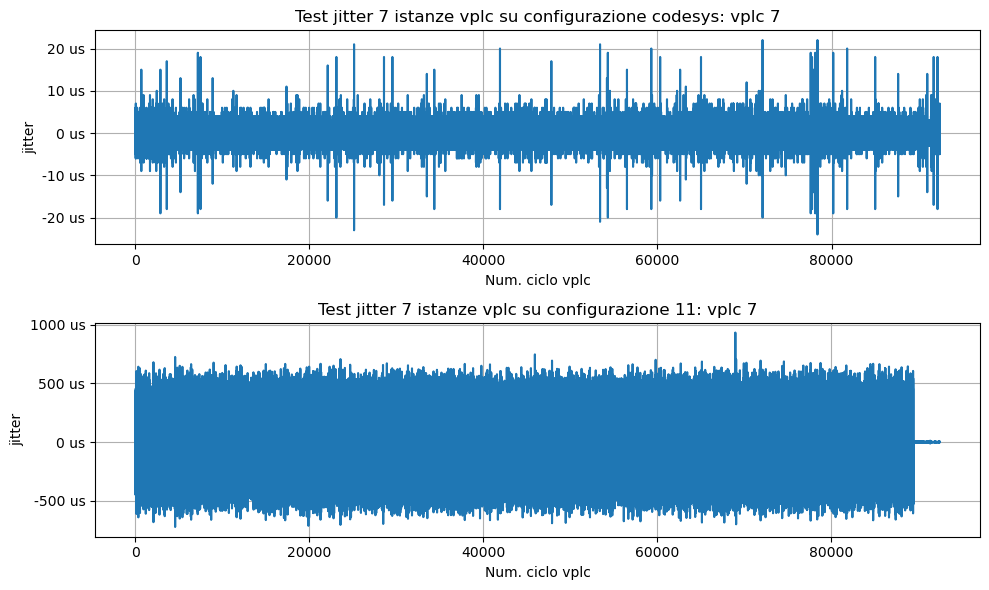

8


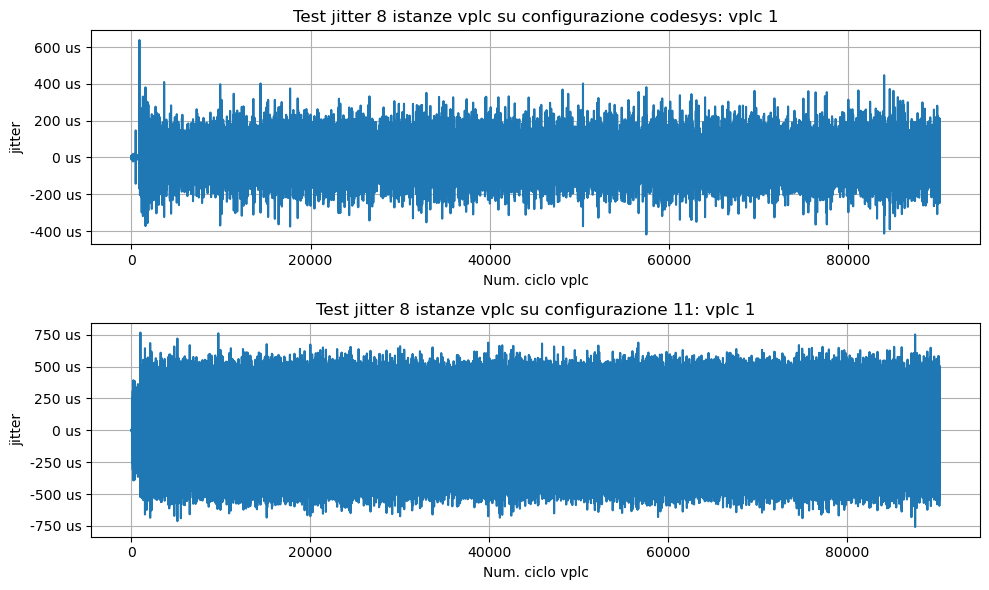

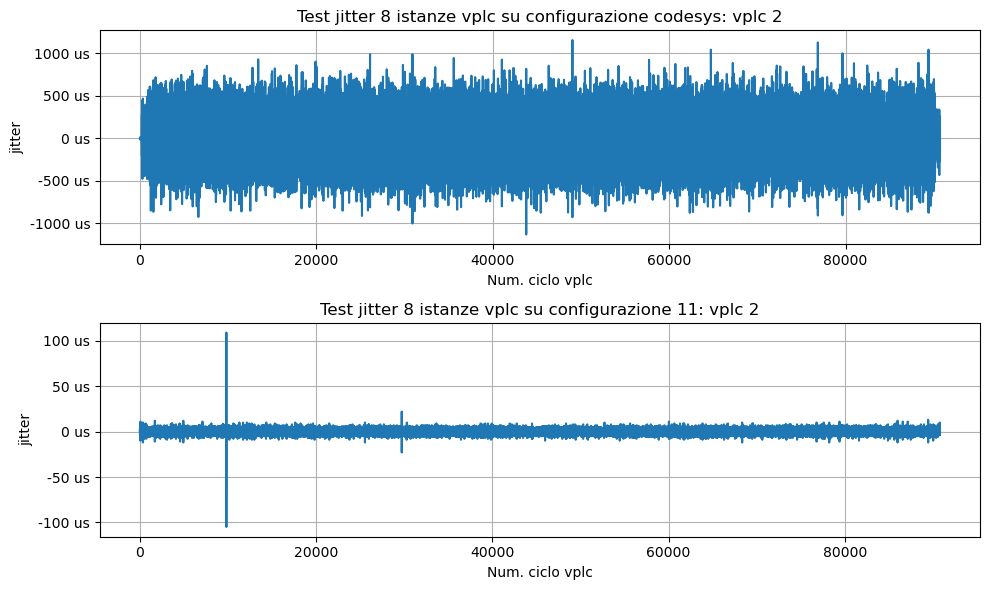

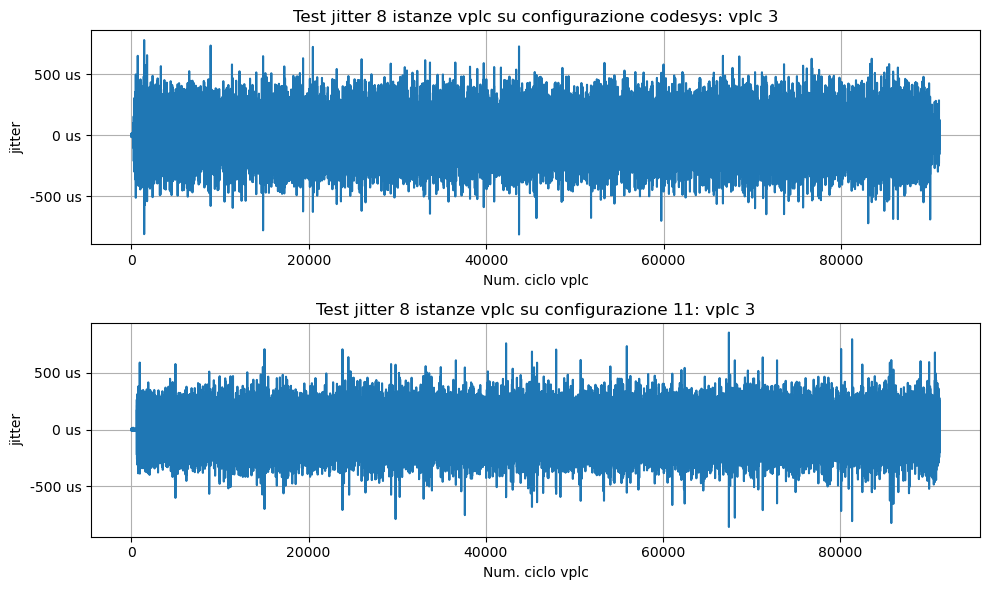

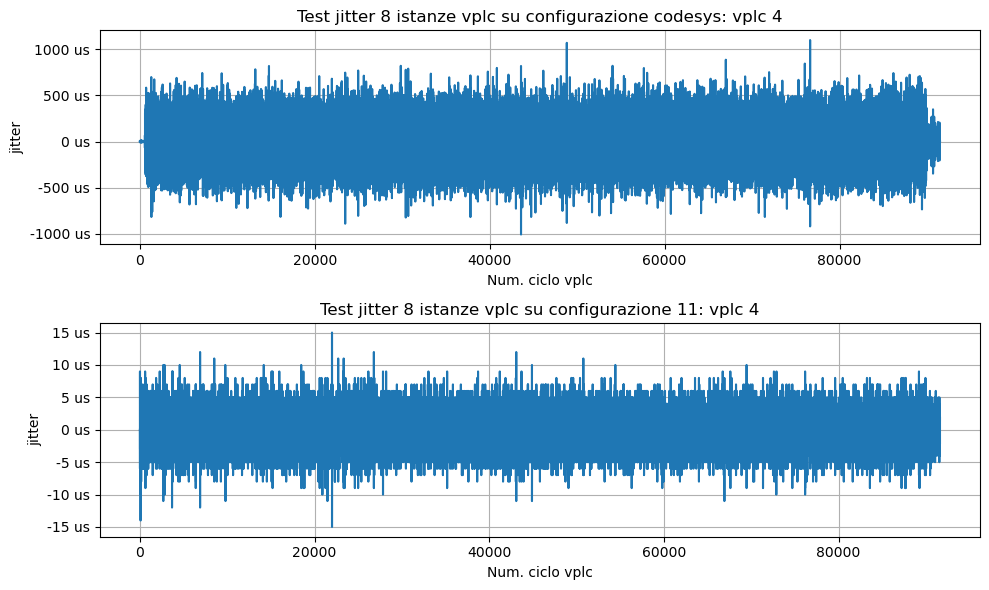

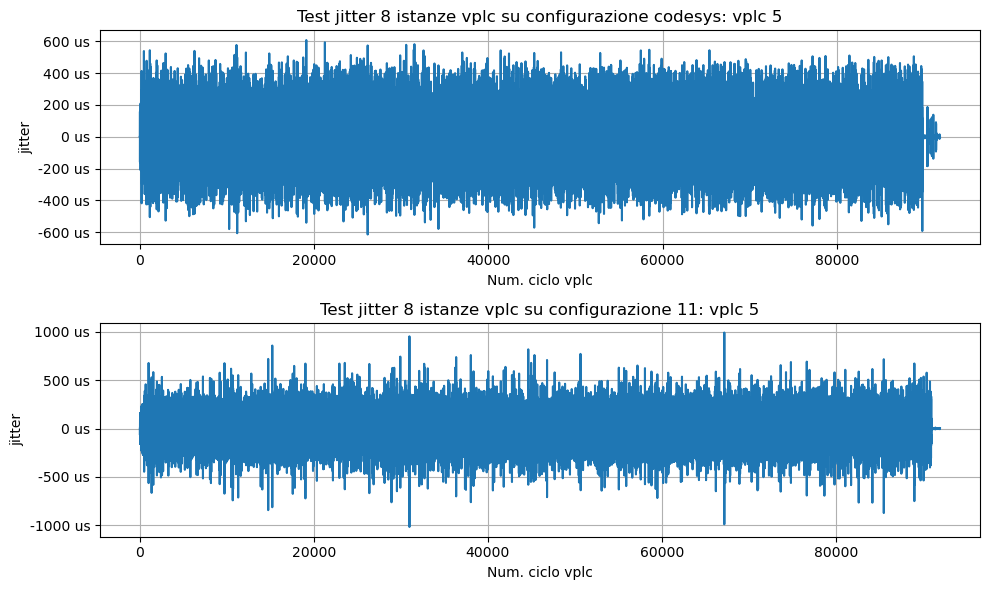

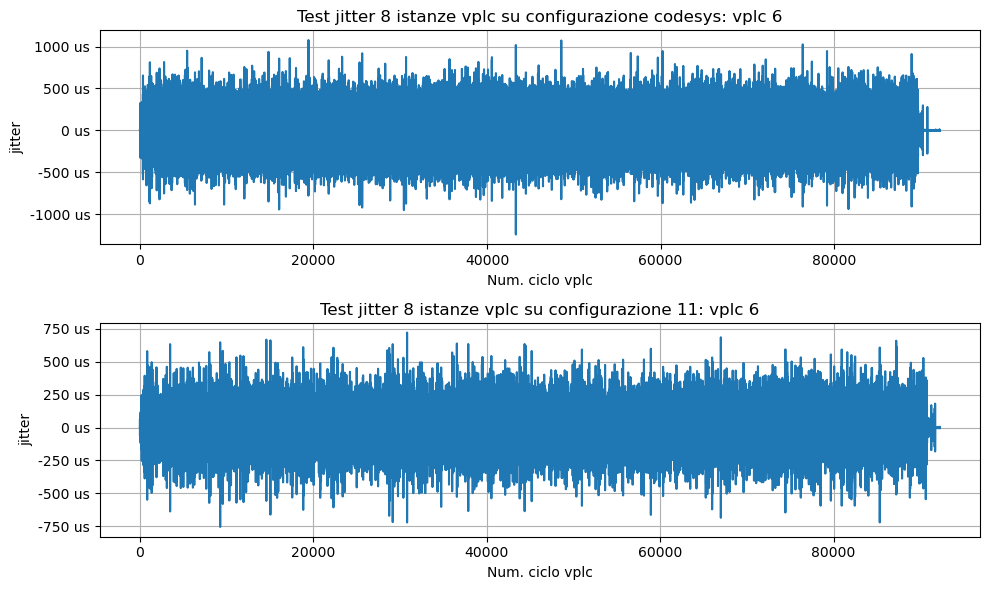

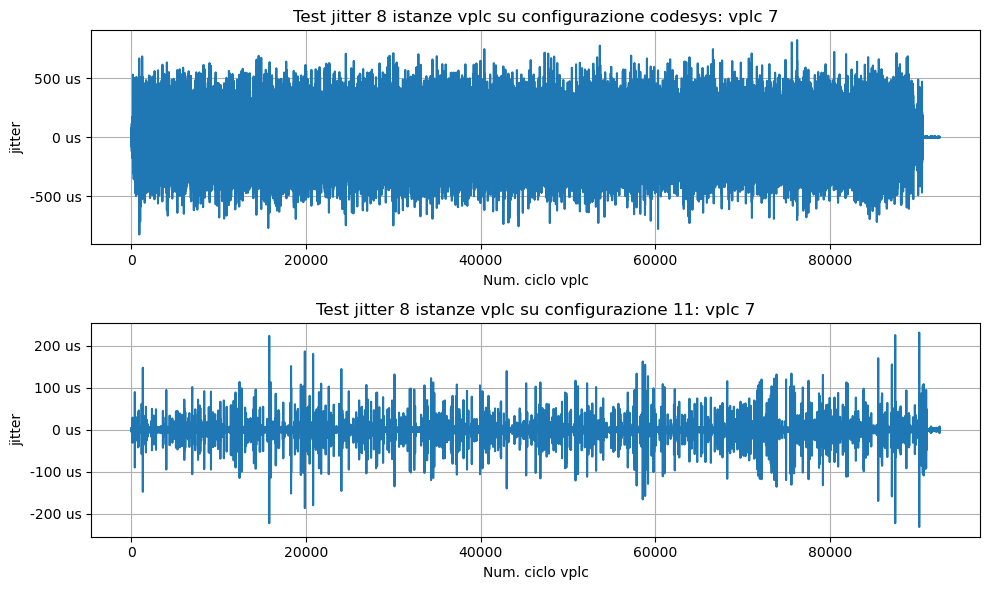

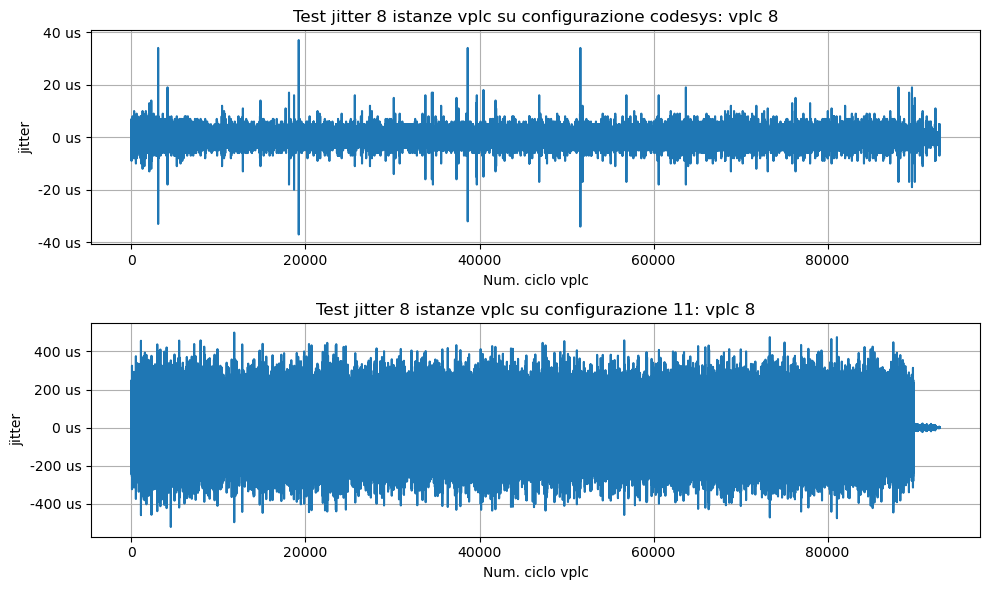

9


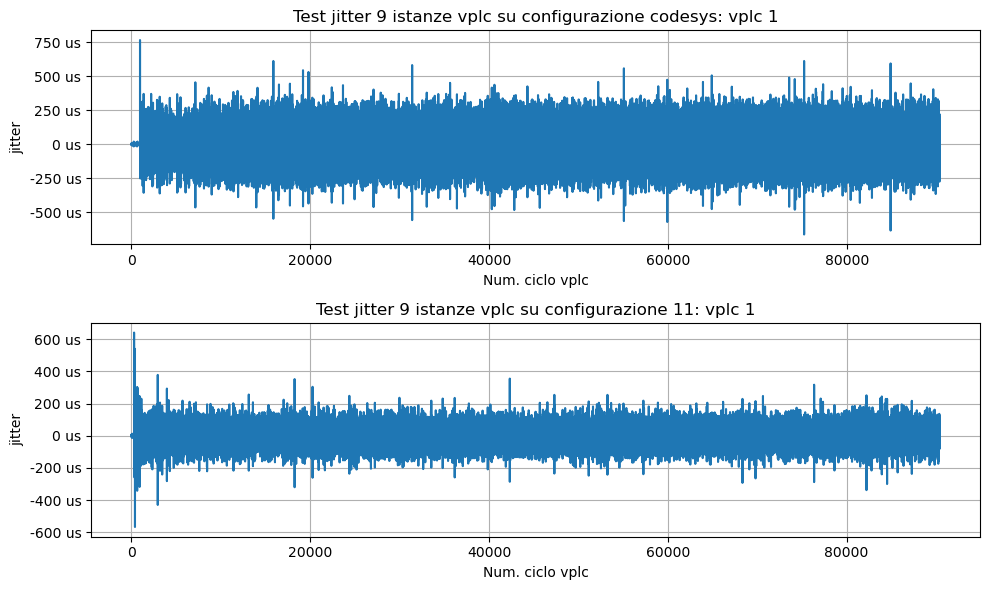

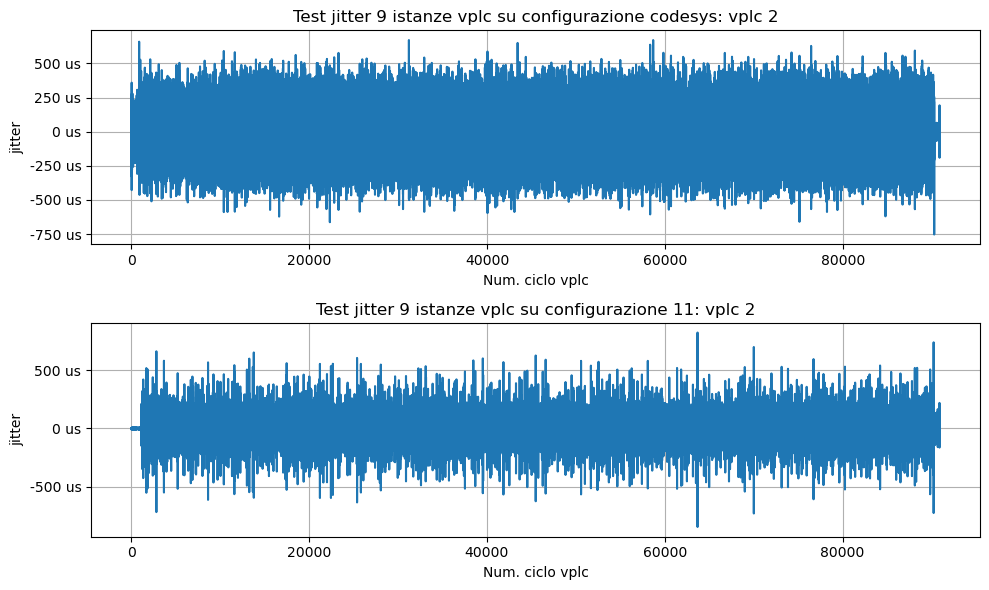

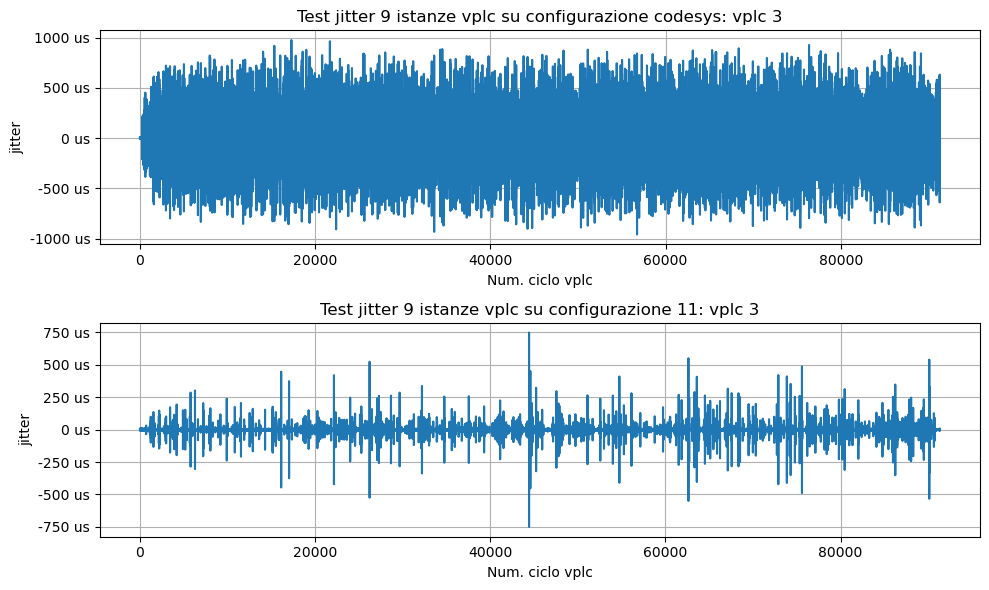

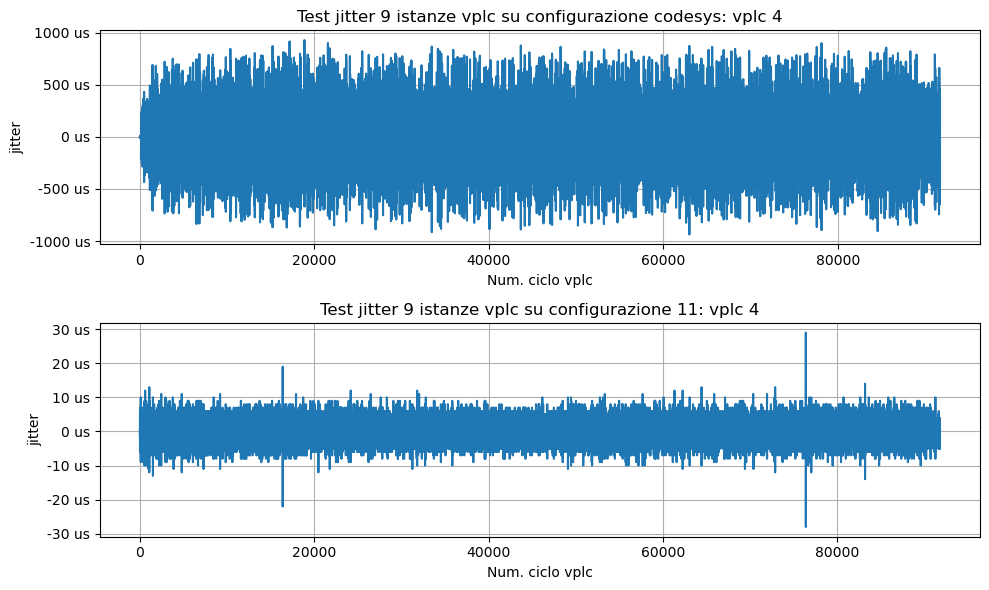

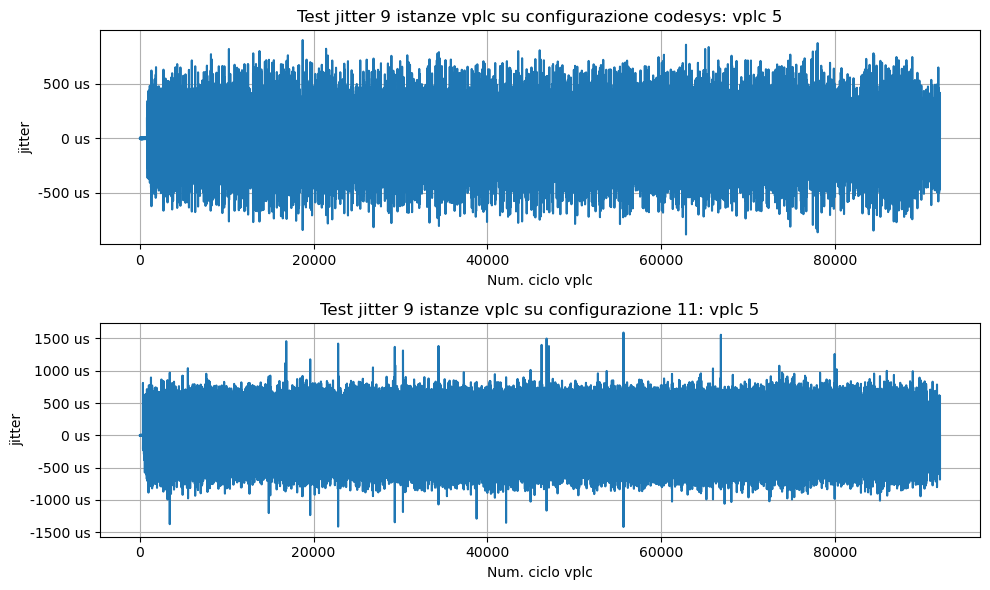

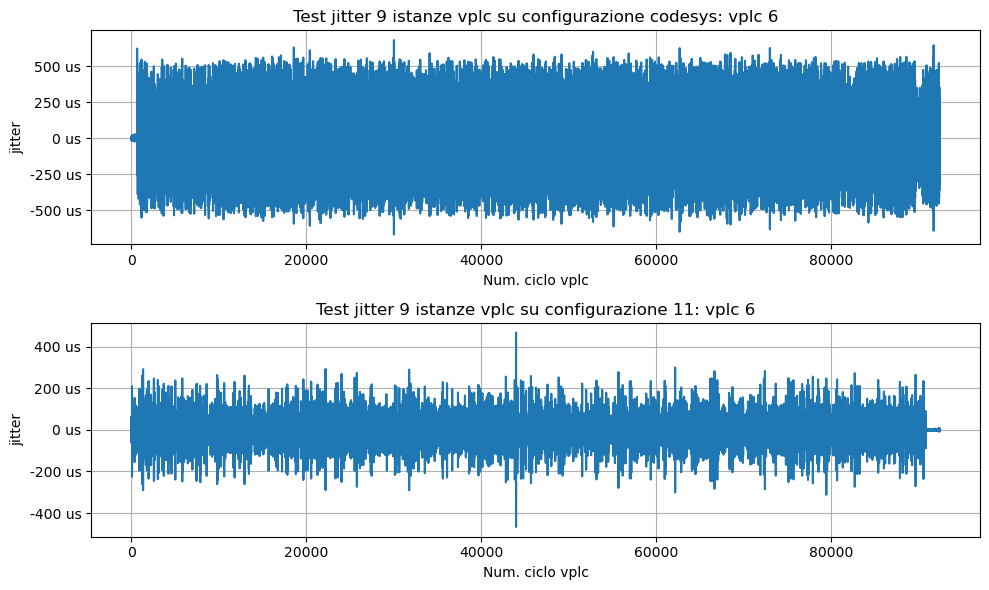

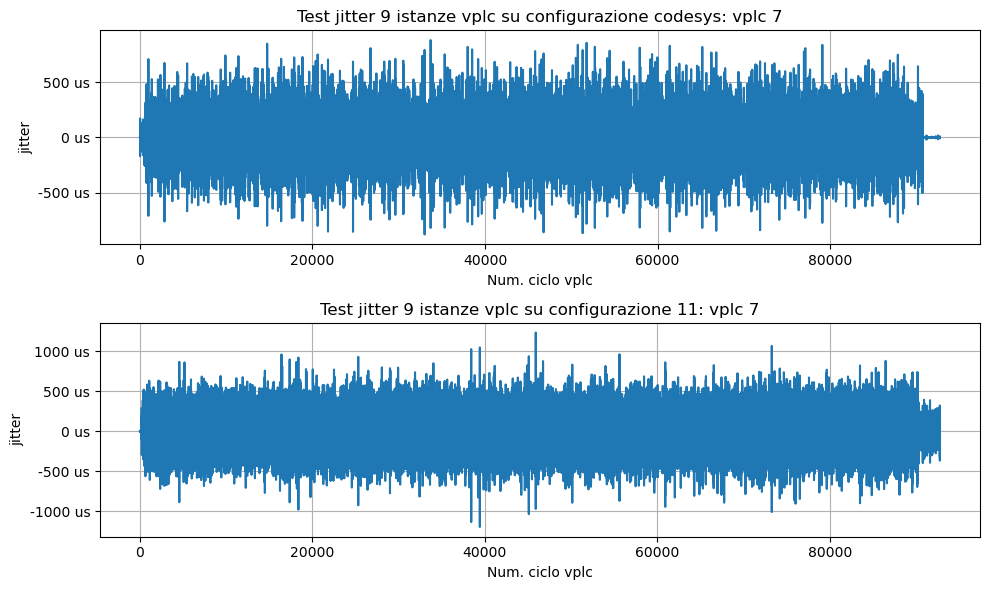

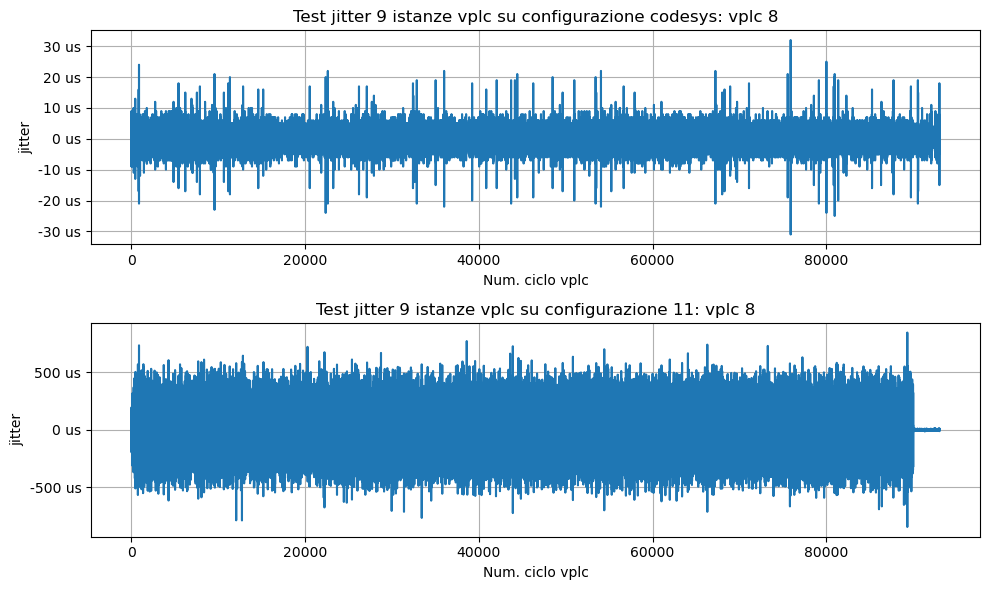

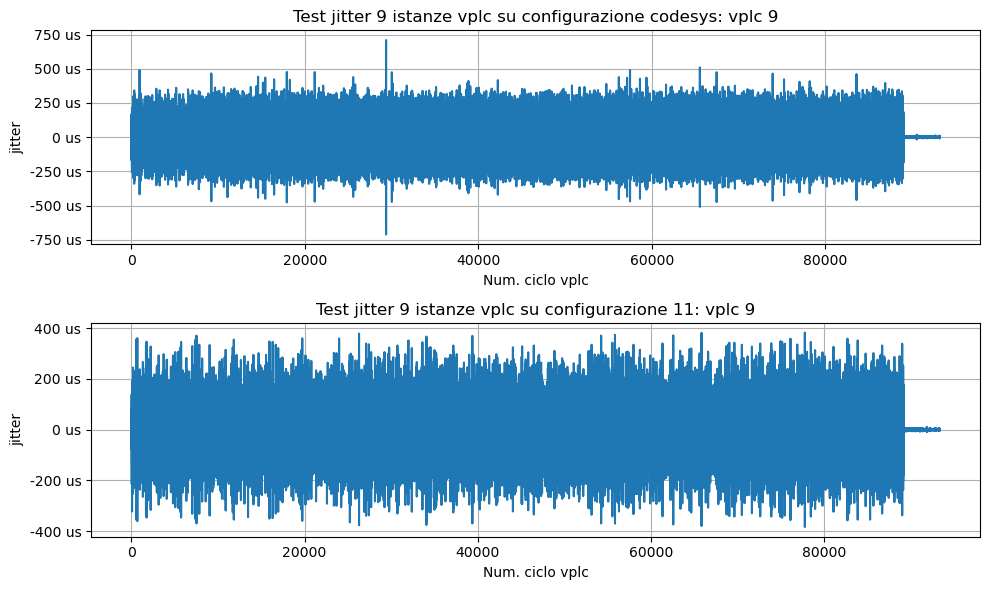

10


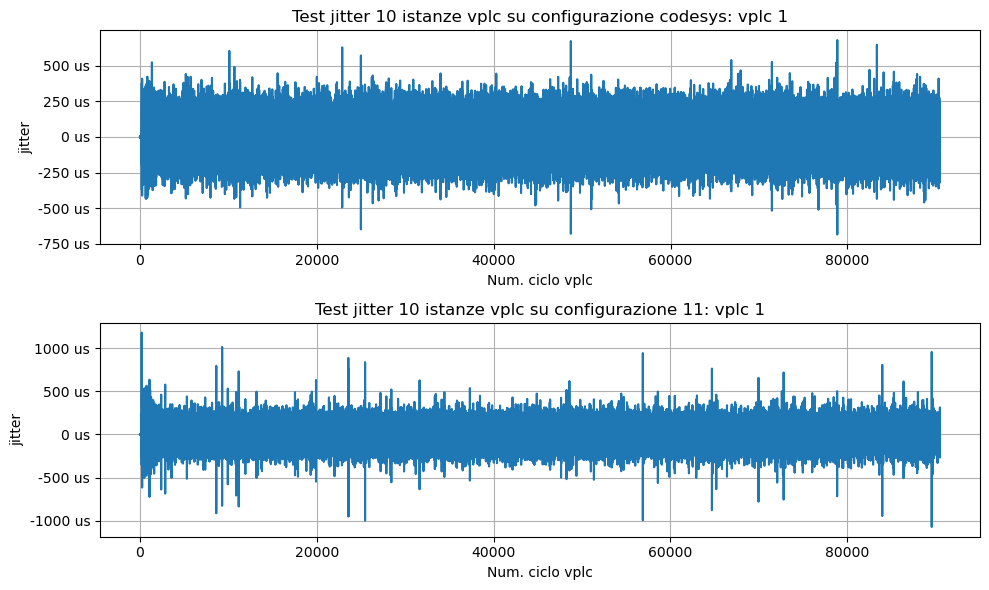

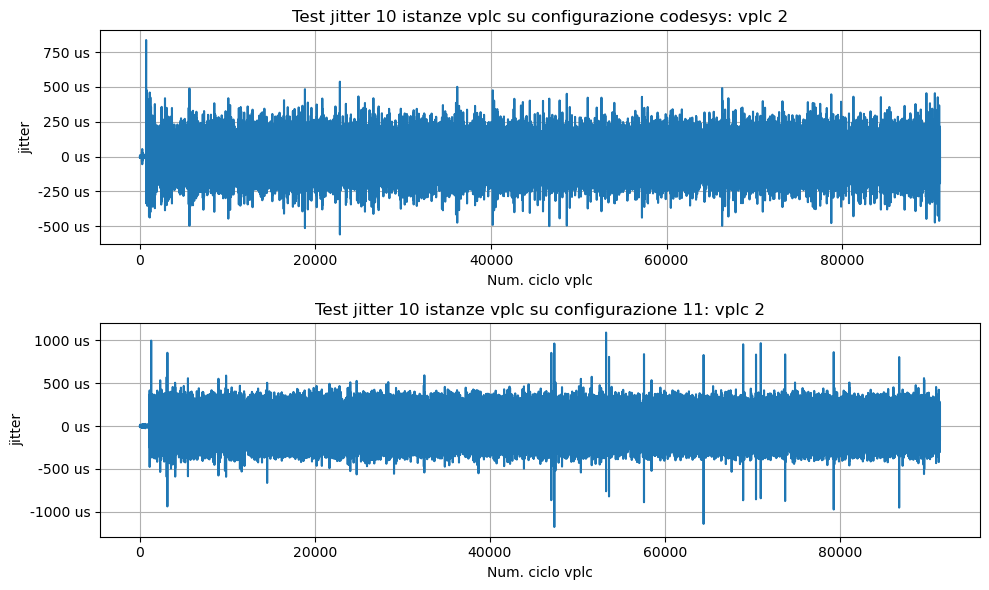

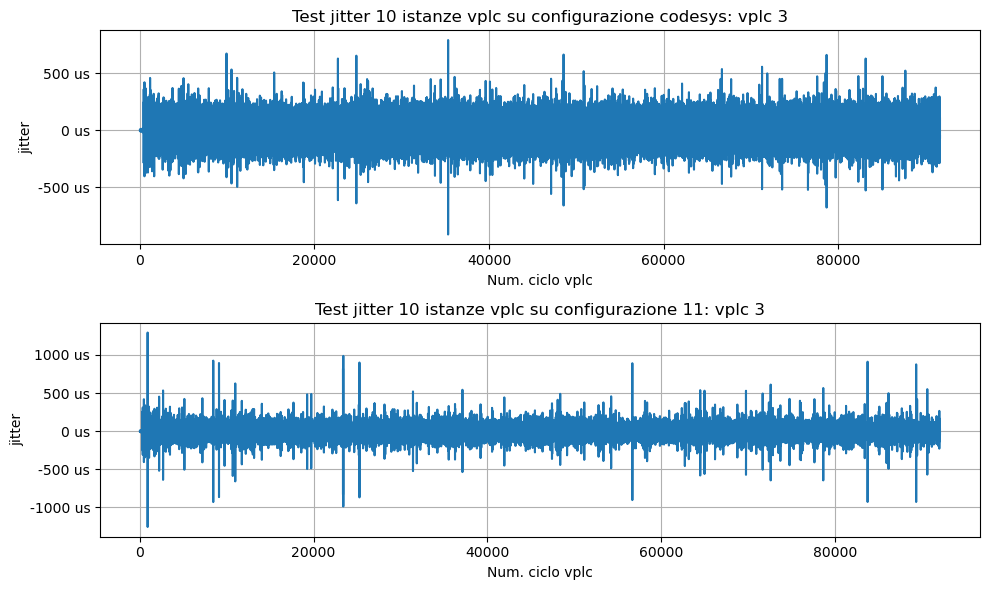

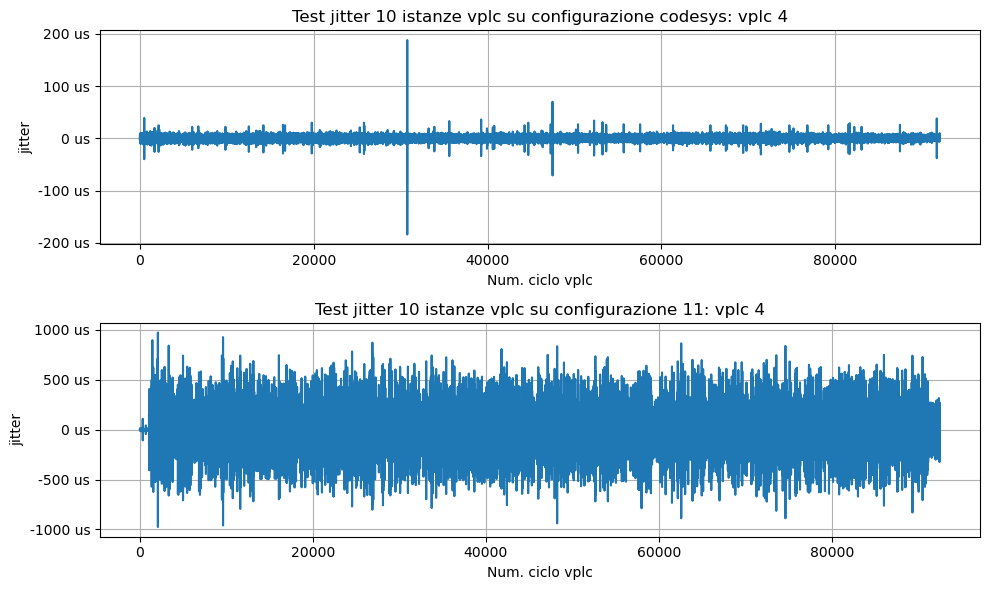

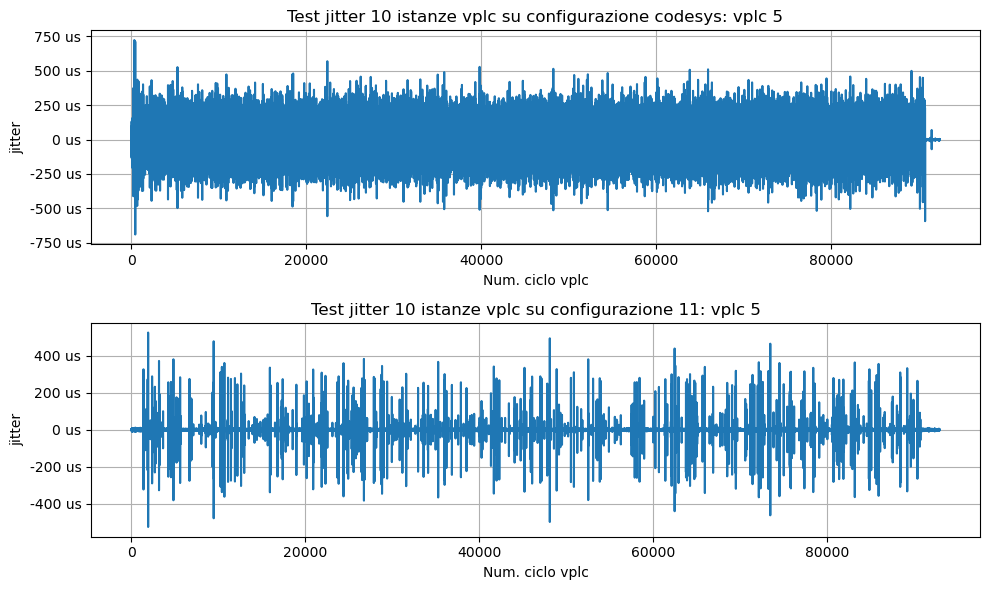

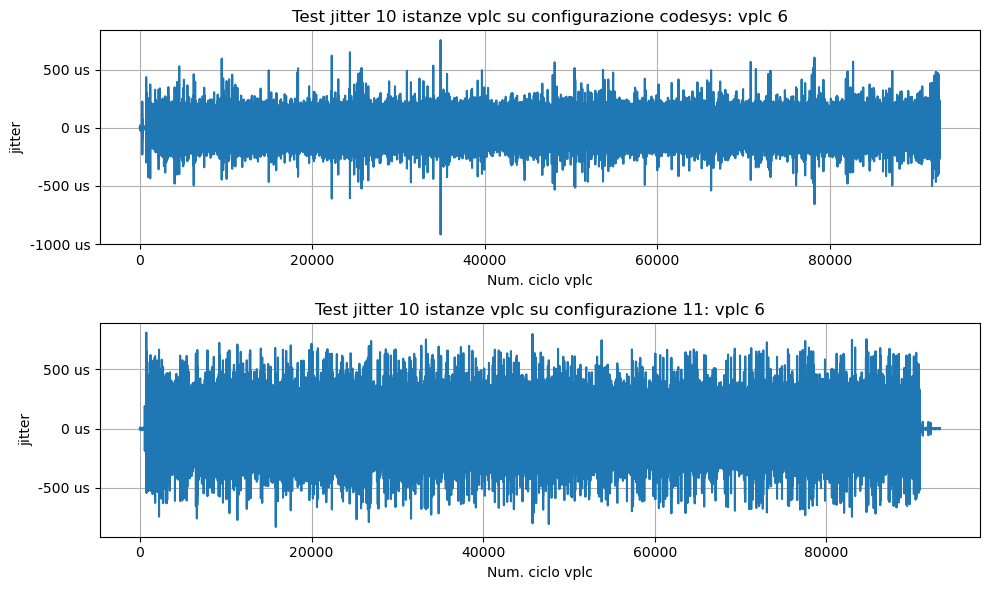

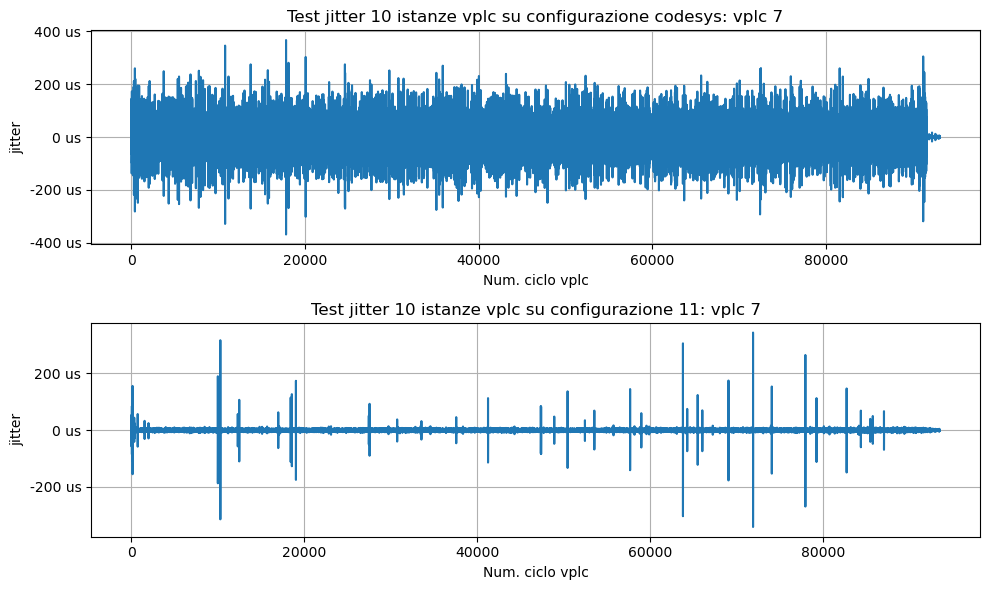

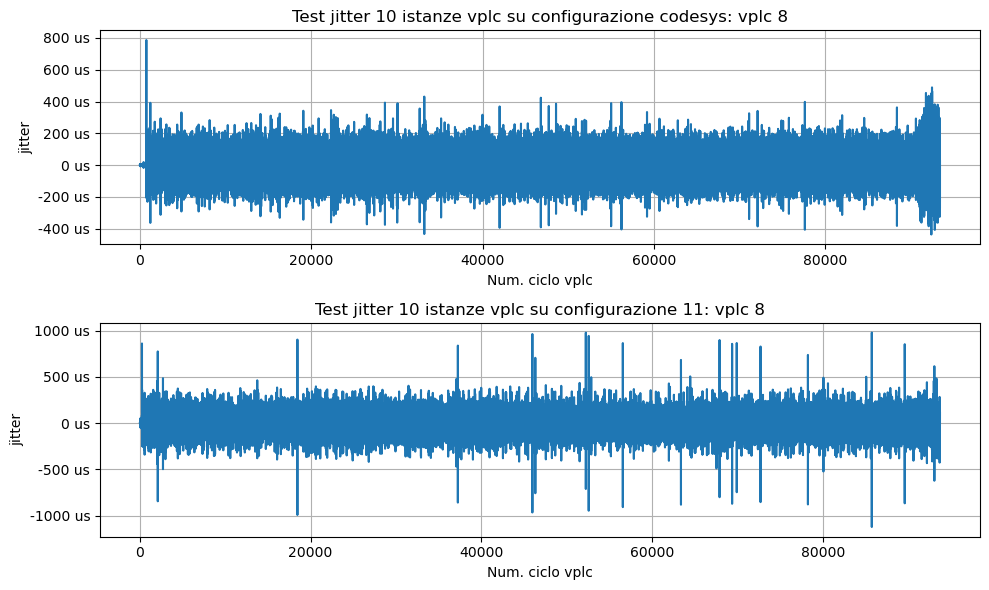

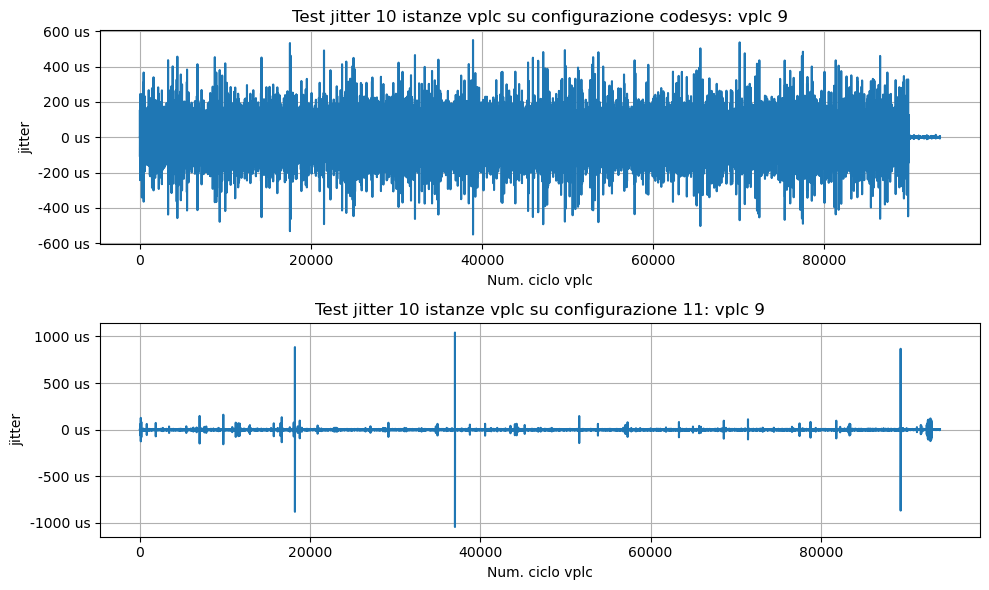

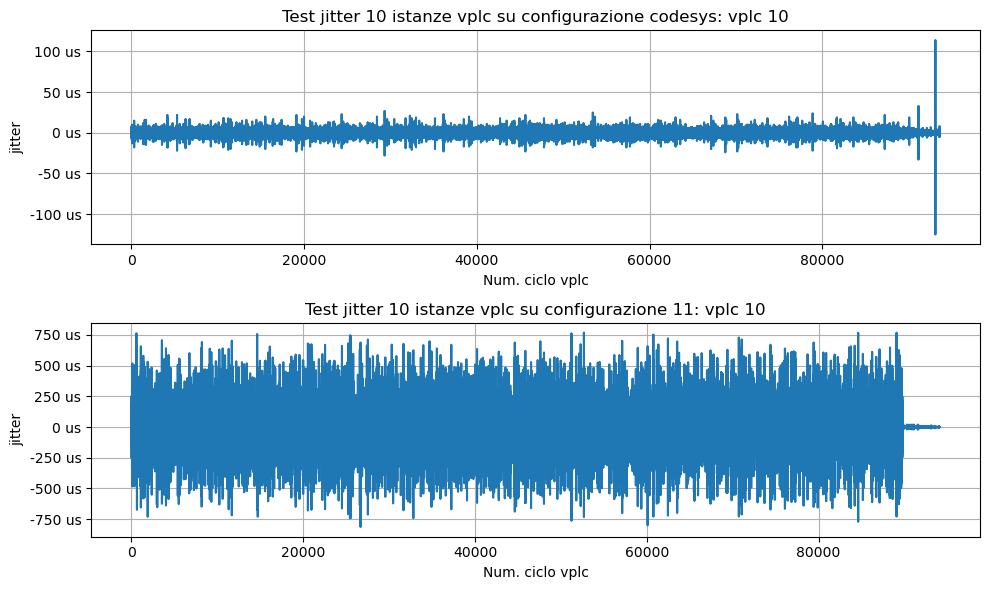

In [12]:
#più istanze vplc crescenti con pin su stessa cpu
#configurazioni a confronto: la 11 con quella di codesys
#metto qui i due percorsi
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-multiplc")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-multiplc")
#ordino le dir numericamente
dir_list = os.listdir(conf_codesys)
dir_list = [d for d in dir_list if d.isdigit()]
sorted_cod_dir = sorted(dir_list, key=lambda x: int(x))

dir_list = os.listdir(conf_new)
dir_list = [d for d in dir_list if d.isdigit()]
sorted_new_dir = sorted(dir_list, key=lambda x: int(x))

# Funzione per estrarre il primo numero dal nome del file
def extract_number(file_name):
    numbers = re.findall(r'\d+', file_name)
    return int(numbers[0]) if numbers else float('inf')  # Ritorna inf se non ci sono numeri

for i in range(1, 11):
    print(i)
    #ordino i file codesys numericamente
    file_list = os.listdir(conf_codesys+'/'+str(i))
    file_list = [f for f in file_list if f.startswith('tasktimes')]
    sorted_files_cod = sorted(file_list, key=extract_number)

    #ordino i file new numericamente
    file_list = os.listdir(conf_new+'/'+str(i))
    file_list = [f for f in file_list if f.startswith('tasktimes')]
    sorted_files_new = sorted(file_list, key=extract_number)

    for k in range(len(sorted_files_cod)):
        resultCodesys = load_jitter2(conf_codesys+'/'+str(i), sorted_files_cod[k])
        resultNewConf = load_jitter2(conf_new+'/'+str(i), sorted_files_new[k])

        plt.figure(figsize=(10, 6))
        plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
        plt.plot(resultCodesys)
        plt.title('Test jitter ' +str(i) + ' istanze vplc su configurazione codesys: vplc '+ str(k+1))
    
        plt.xlabel('Num. ciclo vplc')
        plt.ylabel('jitter')
        plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
        #plt.ylim(0,maxTot)
        plt.grid(True)
    
        plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
        plt.plot(resultNewConf)
        plt.title('Test jitter ' +str(i) + ' istanze vplc su configurazione 11: vplc '+ str(k+1))
        
        plt.xlabel('Num. ciclo vplc')
        plt.ylabel('jitter')
        plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
       # plt.ylim(0,maxTot)
        plt.grid(True)
        
        plt.tight_layout() 
        plt.show()
      
    

tasktimesCon1_0.log
tasktimesCon1_1.log
tasktimesCon1_2.log
tasktimesCon1_3.log
720584
tasktimes_0.log
tasktimes_1.log
tasktimes_2.log
tasktimes_3.log
tasktimes_4_not_part_of_it.log
836966
1557550


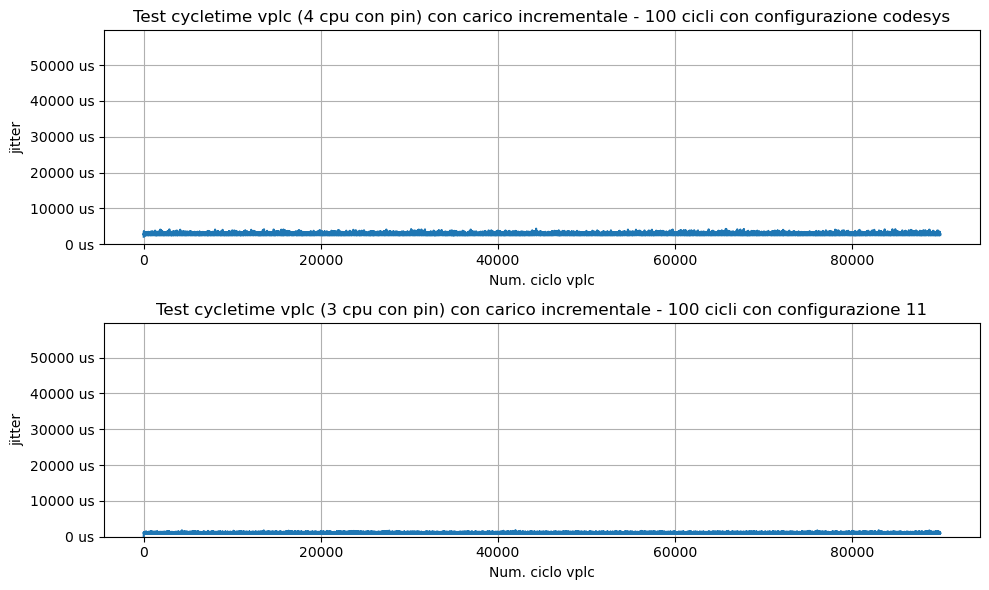

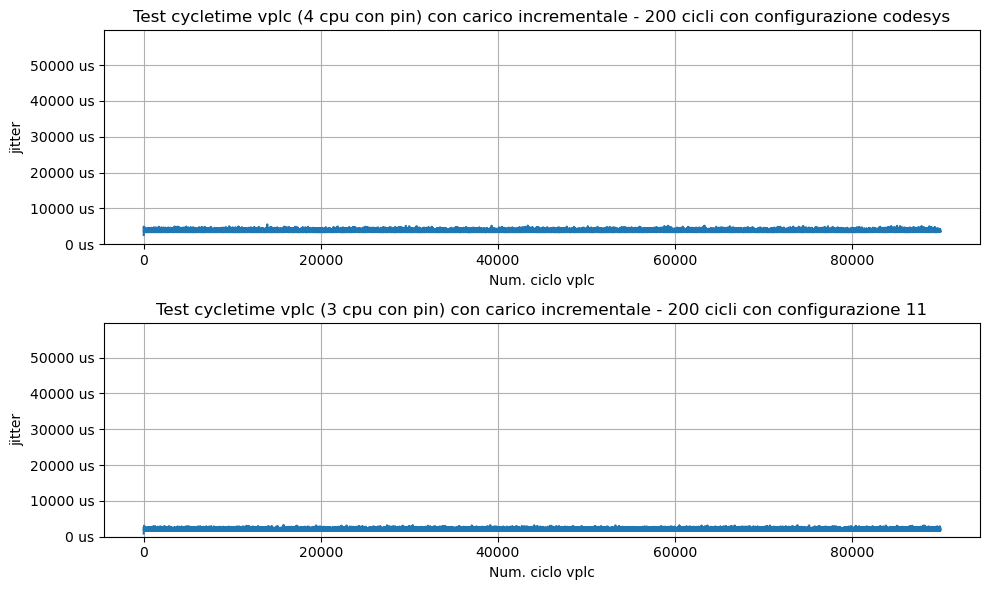

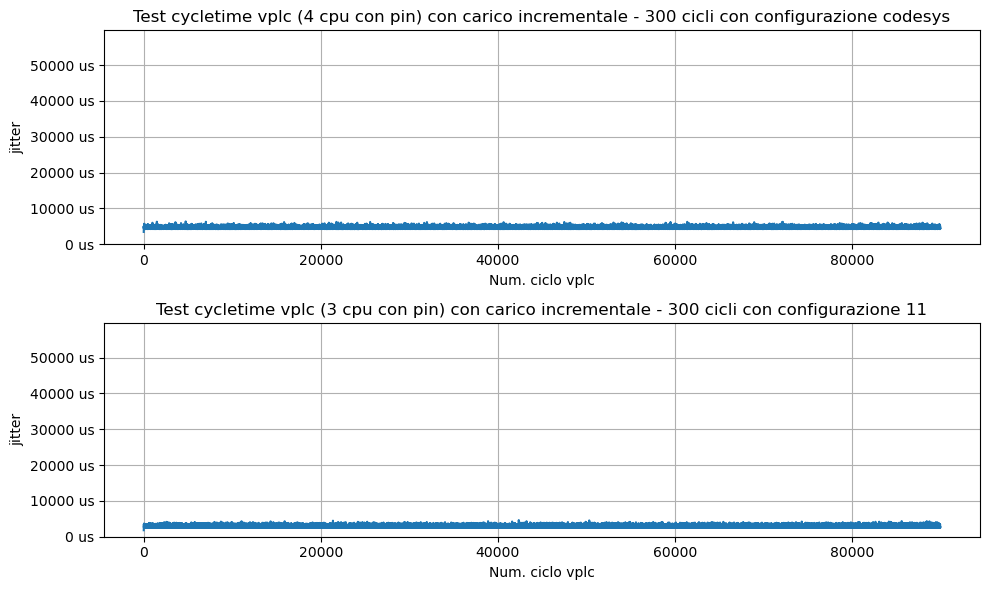

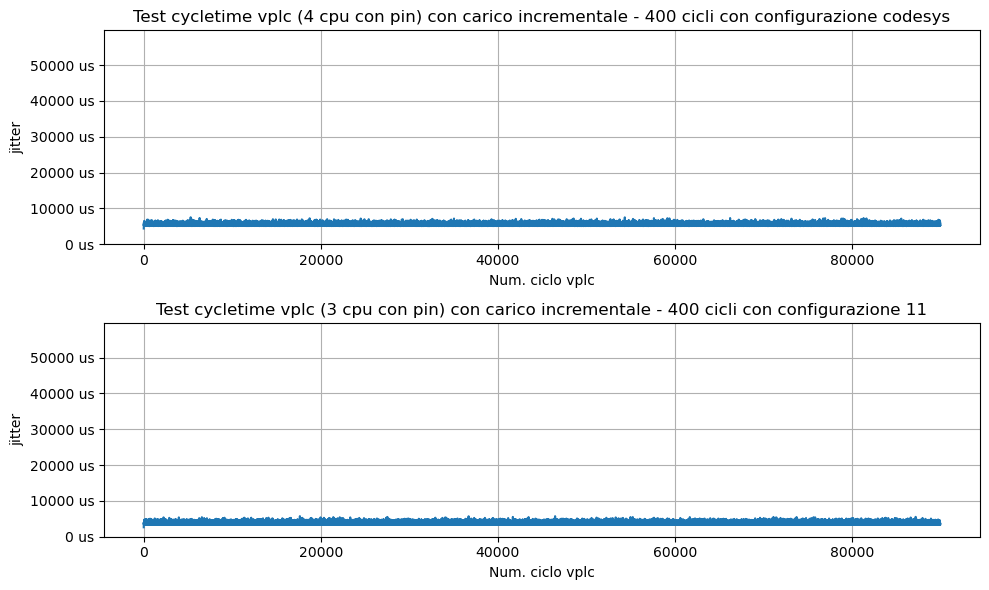

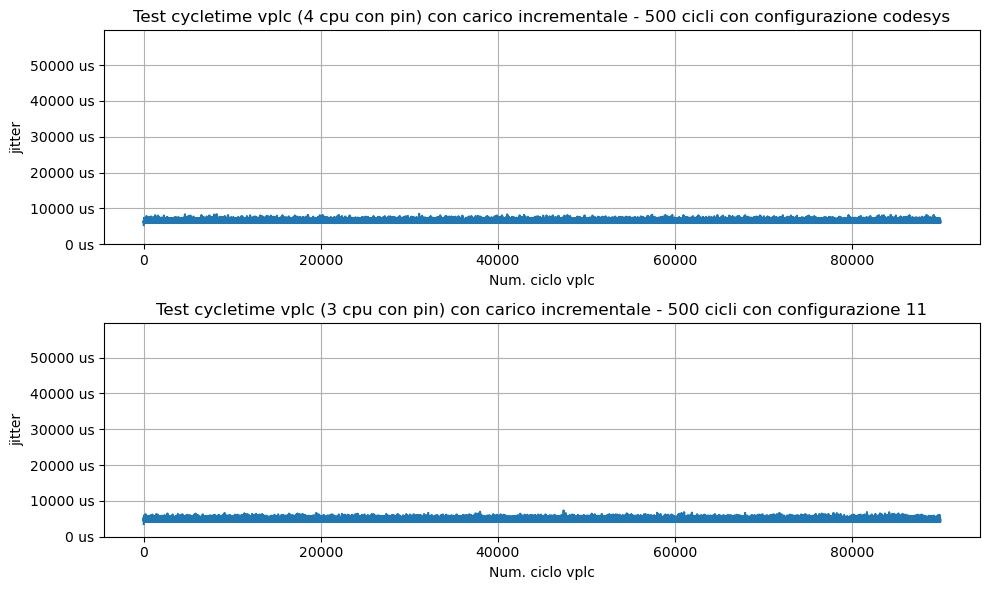

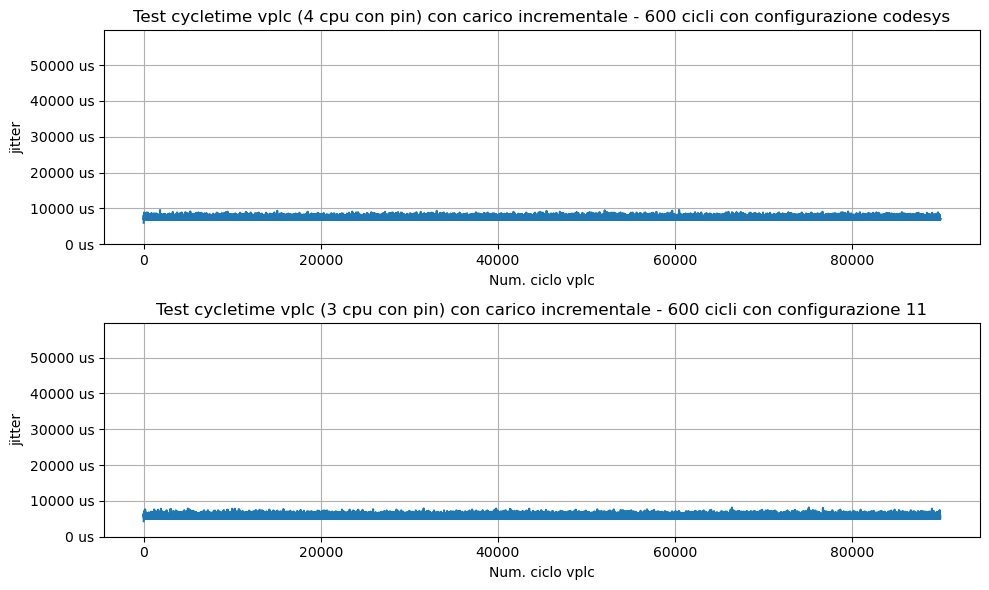

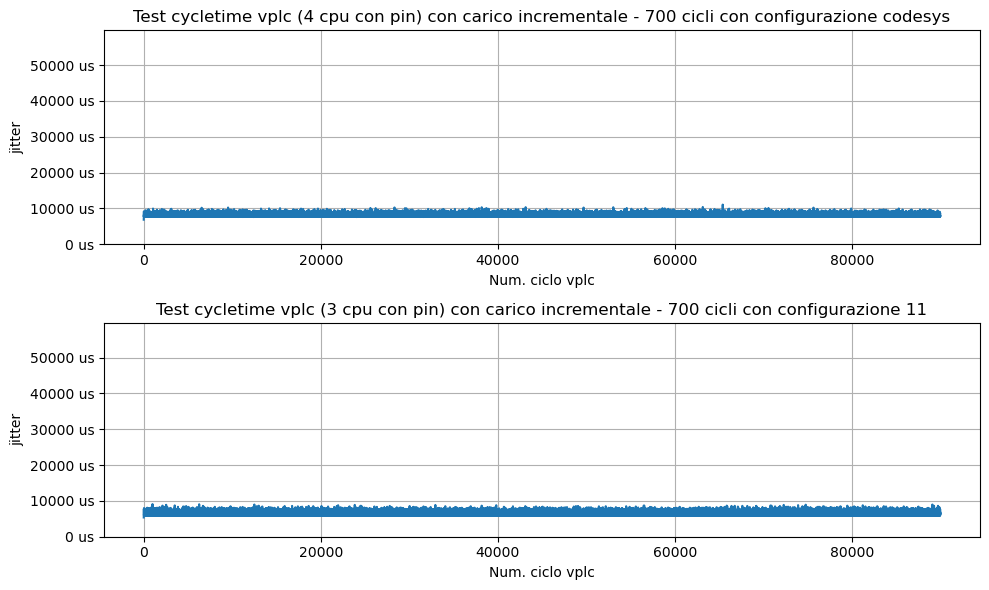

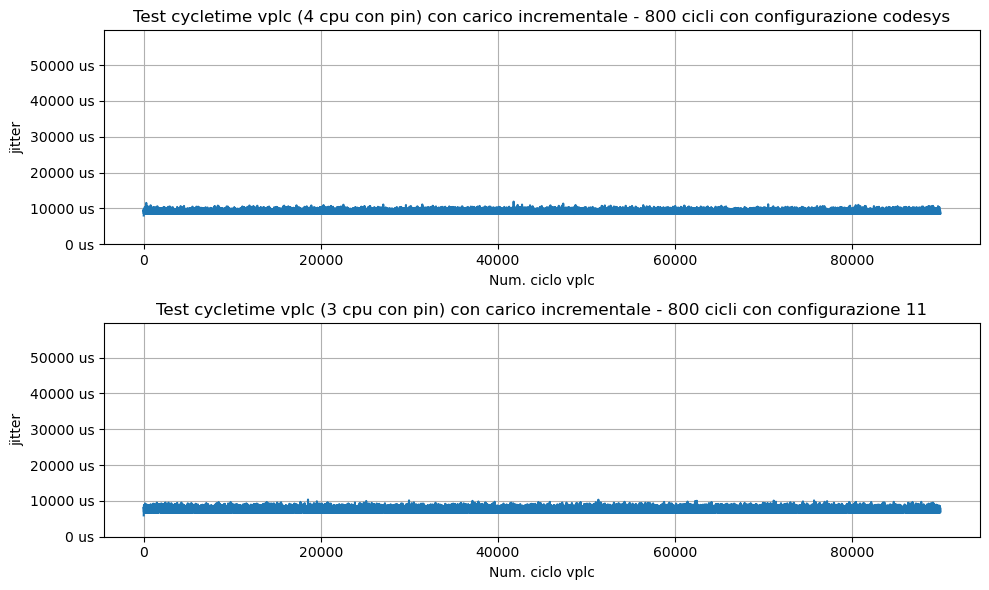

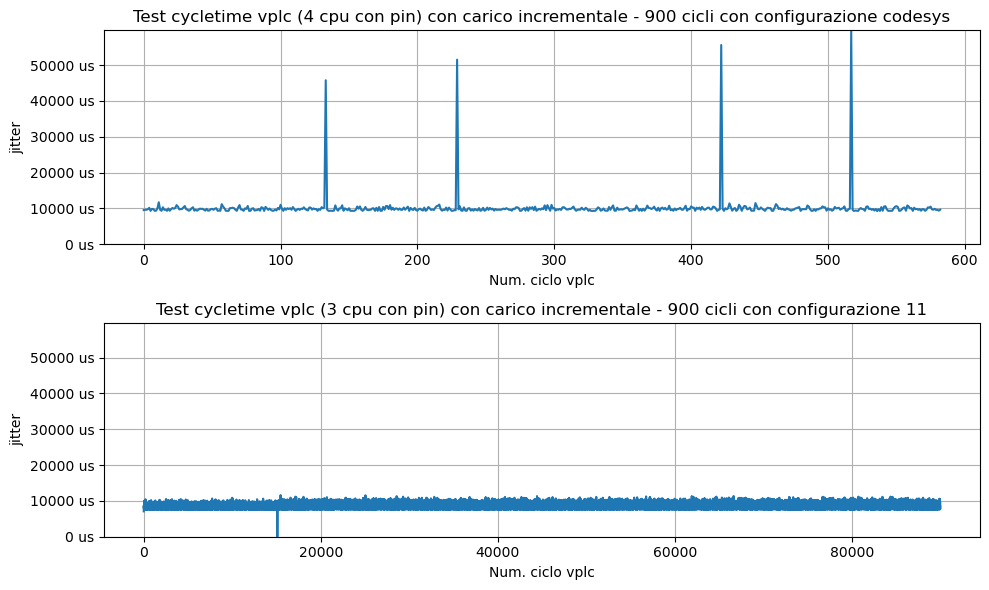

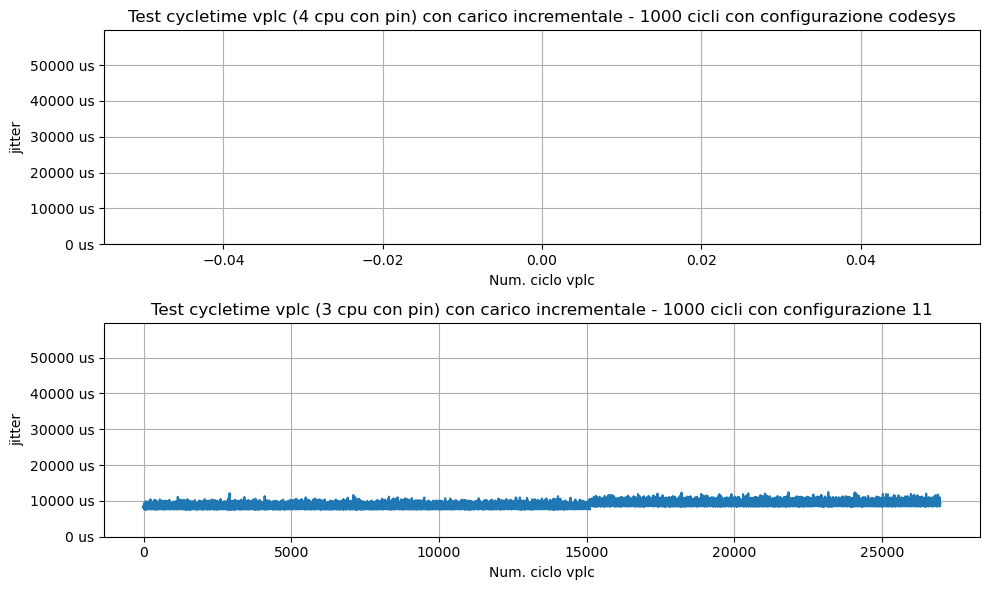

In [13]:
#configurazioni a confronto: la 11 con quella di codesys per cycletime
#metto qui i due percorsi
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-increase-4cpu-pin")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-increase-3cpu-pin")
val=90000 
k=100
cycleTimeCodesys=[]
cycleTimeNewConf=[]
cycleTimeTot=[]
#prendo tutti i log della configurazione codesys
for f in sorted(os.listdir(conf_codesys)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultCodesys = load_cycleTime2(conf_codesys, f)
        cycleTimeCodesys+=resultCodesys
        print(f)
        
if os.path.exists(conf_codesys + "/" + "tasktimes.log"):
    resultCodesys = load_cycleTime2(conf_codesys, f)
    cycleTimeCodesys+=resultCodesys
    print("tasktimes.log")
    
print(len(cycleTimeCodesys))

#prendo tutti i log della configurazione 11
for f in sorted(os.listdir(conf_new)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultNewConf = load_cycleTime2(conf_new, f)
        cycleTimeNewConf+=resultNewConf
        print(f)
        
if os.path.exists(conf_new + "/" + "tasktimes.log"):
    resultNewConf = load_cycleTime2(conf_new, f)
    cycleTimeNewConf+=resultNewConf
    print("tasktimes.log")

print(len(cycleTimeNewConf))

#prendo la y massima

cycleTimeTot=cycleTimeCodesys+cycleTimeNewConf
print(len(cycleTimeTot))
maxTot=max(cycleTimeTot)


#stampo le due configurazioni nello stesso grafico 
for i in range(1, max(len(cycleTimeNewConf), len(cycleTimeCodesys)), val):
    plt.figure(figsize=(10, 6))
    resultCodesys=cycleTimeCodesys[i:i+val]
    resultNewConf=cycleTimeNewConf[i:i+val]
  

    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('Test cycletime vplc (4 cpu con pin) con carico incrementale - ' + str(k) + ' cicli con configurazione codesys')

    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(0,maxTot)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('Test cycletime vplc (3 cpu con pin) con carico incrementale - ' + str(k) + ' cicli con configurazione 11')
    
    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(0,maxTot)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.show()
    k=k+100


In [14]:
#configurazioni a confronto: la 11 con quella di codesys per cycletime
#metto qui i due percorsi
conf_codesys = os.path.join(os.getcwd(), "testrun-vplc/test0-increase-4cpu-pin")
conf_new = os.path.join(os.getcwd(), "testrun-vplc/test11-increase-3cpu-pin")
val=90000 
k=100
cycleTimeCodesys= np.empty(0)
cycleTimeNewConf=[]
cycleTimeTot=[]

#prendo tutti i log della configurazione codesys
for f in sorted(os.listdir(conf_codesys)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultCodesys = load_cycleTime2(conf_codesys, f)
        cycleTimeCodesys.append(resultCodesys)
        print(f)
        
if os.path.exists(conf_codesys + "/" + "tasktimes.log"):
    resultCodesys = load_cycleTime2(conf_codesys, f)
    cycleTimeCodesys+=resultCodesys
    cycleTimeCodesys.append(resultCodesys)
    print("tasktimes.log")
    
print(len(cycleTimeCodesys))

#prendo tutti i log della configurazione 11
for f in sorted(os.listdir(conf_new)):
    contains_integer = re.search(r'\d+', f)
    if contains_integer and f.startswith("tasktimes"):
        resultNewConf = load_cycleTime2(conf_new, f)
        cycleTimeNewConf+=resultNewConf
        print(f)
        
if os.path.exists(conf_new + "/" + "tasktimes.log"):
    resultNewConf = load_cycleTime2(conf_new, f)
    cycleTimeNewConf+=resultNewConf
    print("tasktimes.log")

print(len(cycleTimeNewConf))

#prendo la y massima

cycleTimeTot=cycleTimeCodesys+cycleTimeNewConf
print(len(cycleTimeTot))
maxTot=max(cycleTimeTot)


#stampo le due configurazioni nello stesso grafico 
for i in range(1, max(len(cycleTimeNewConf), len(cycleTimeCodesys)), val):

    plt.figure(figsize=(10, 6))
    plt.boxplot(cycleTimeCodesys, vert=True, showfliers=False, showmeans=True)
    plt.title('test runtime vplc Gruppo '+ str(l+1))
    plt.xlabel('Numero container di carico')
    plt.ylabel('Valore runtime')
    plt.show()
                   
    plt.figure(figsize=(10, 6))
    resultCodesys=cycleTimeCodesys[i:i+val]
    resultNewConf=cycleTimeNewConf[i:i+val]
  

    plt.subplot(2, 1, 1)  # 2 righe, 1 colonna, primo subplot
    plt.plot(resultCodesys)
    plt.title('Test cycletime vplc (4 cpu con pin) con carico incrementale - ' + str(k) + ' cicli con configurazione codesys')

    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(0,maxTot)
    plt.grid(True)

    plt.subplot(2, 1, 2)  # 2 righe, 1 colonna, secondo subplot
    plt.plot(resultNewConf)
    plt.title('Test cycletime vplc (3 cpu con pin) con carico incrementale - ' + str(k) + ' cicli con configurazione 11')
    
    plt.xlabel('Num. ciclo vplc')
    plt.ylabel('jitter')
    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
    plt.ylim(0,maxTot)
    plt.grid(True)
    
    plt.tight_layout() 
    plt.show()
    k=k+100


AttributeError: 'numpy.ndarray' object has no attribute 'append'

In [ ]:
for l in range(0, len(tests)): # da 0 a 3
    jitterTest = []
    jitter = np.empty(0)
    for k in range(0, len(tests[l])): # lunghezza di ogni singolo test (1-1/1-10, 2-1/2-2, 3-1/3-3, 4-1/4-10) 
        for f in os.listdir(log_dir + '/' + tests[l][k]):
                if f.startswith("tasktimes"):
                    jitter = load_jitter(f)
                    print(tests[l][k])
                    print (len(jitter))
                    plt.figure(figsize=(10, 6))
                    plt.plot(jitter)
                    plt.xlabel('Num. ciclo vplc')
                    plt.ylabel('jitter')
                    plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d us'))
                    plt.title('Test jitter vplc su configurazione 11 con Fibonacci costante: batch '+ str(l+1)+ ' con '+str(k+1) +' container di carico')
                    plt.grid(True)
                    plt.show()
                    break;

    

In [ ]:
#faccio parsing dei valori per ogni sottocartella test*/*-*
#creo tanti dataframe distinti per ogni cartella dei test

for l in range(0, len(tests)): # da 0 a 3
    vplcTest = []
    cycletime = np.empty(0)
    for k in range(0, len(tests[l])): # lunghezza di ogni singolo test (1-1/1-10, 2-1/2-2, 3-1/3-3, 4-1/4-10) 
        for f in os.listdir(log_dir + '/' + tests[l][k]):
                if f.startswith("tasktimes"):
                    cycletime = load_jitter(f)
                    #print (cycletime)
                    break;
        vplcTest.append(cycletime)

    plt.figure(figsize=(10, 6))
    plt.boxplot(vplcTest, vert=True, showfliers=False, showmeans=True)
    plt.title('test runtime vplc Gruppo '+ str(l+1))
    plt.xlabel('Numero container di carico')
    plt.ylabel('Valore runtime')
    plt.show()
                   

In [ ]:
#faccio parsing dei valori per ogni sottocartella test*/*-*
#creo tanti dataframe distinti per ogni cartella dei test

for l in range(0, len(tests)): # da 0 a 3
    vplcTest = []
    cycletime = np.empty(0)
    for k in range(0, len(tests[l])): # lunghezza di ogni singolo test (1-1/1-10, 2-1/2-2, 3-1/3-3, 4-1/4-10) 
        for f in os.listdir(log_dir + '/' + tests[l][k]):
                if f.startswith("tasktimes"):
                    cycletime = load_data(f)
                    #print (cycletime)
                    break;
        vplcTest.append(cycletime)

    plt.figure(figsize=(10, 6))
    plt.boxplot(vplcTest, vert=True, showfliers=False, showmeans=True)
    plt.title('test runtime vplc Gruppo '+ str(l+1))
    plt.xlabel('Numero container di carico')
    plt.ylabel('Valore runtime')
    plt.show()
                   